In [36]:
#!/usr/bin/env python
import sys, math
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
import numpy as np
import glob
import random

import aux
import data_classes as dc
import myplot as mypl
import physics as ph

inputpath = aux.COMMON_INPUT_PATH
outputpath = aux.COMMON_OUTPUT_PATH
dirLabel = mypl.dirLabel
muondatapath = aux.MUON_DATA_PATH
print(muondatapath)

%load_ext autoreload
%autoreload 2


/eos/user/l/lrygaard/ttalp/ttj_cluster_runs/
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# Plot setups
massLabels = [r"$m_a=300\,$MeV",r"$m_a=1\,$GeV",r"$m_a=10\,$GeV",r"$m_a=50\,$GeV"]
masses = [0.3,1,10,50]
labels_ttj = [r'$t\bar{t}j$ muon pairs',r'$t\bar{t}j$ muon non-pairs',r'$t\bar{t}j$ same sign muon',r'$t\bar{t}j$ single muon']

intlumi = 150*1000 #pb-1

# cross-sections in pb
cross_incl_all = [0.08800288, 0.0878576, 0.0923017, 0.09592004, 0.09589373000000001, 
                  0.09378335999999998, 0.08844931999999998, 0.08216535999999999, 0.06951777000000002, 
                  0.04509247499999999]
cross_incl = []
cross_incl.append(cross_incl_all[1]) # 300 MeV
cross_incl.append(cross_incl_all[2]) # 1 GeV
cross_incl.append(cross_incl_all[5]) # 10 GeV
cross_incl.append(cross_incl_all[8]) # 50 GeV
cross_ttj = [233.923699]

N_incl = []
for i in range(len(masses)):
    N_incl.append(100000)
N_ttj = [100*100000]


# Creating Datasets

In [3]:
# Inclusive signal:
filenames_inclusive= []
filenames_inclusive.append(inputpath+"inclusive/ma000300.lhe")
filenames_inclusive.append(inputpath+"inclusive/ma001000.lhe")
filenames_inclusive.append(inputpath+"inclusive/ma010000.lhe")
filenames_inclusive.append(inputpath+"inclusive/ma050000.lhe")

data_inclusive_input = [dc.Dataset.from_lhe_alp(filename)
                     for filename in filenames_inclusive]

/eos/user/j/jalimena/TTALP/lhe_files/inclusive/ma000300.lhe read with [alp, top, antitop, muon, antimuon] in 100000 Events, where muons generated
/eos/user/j/jalimena/TTALP/lhe_files/inclusive/ma001000.lhe read with [alp, top, antitop, muon, antimuon] in 100000 Events, where muons generated
/eos/user/j/jalimena/TTALP/lhe_files/inclusive/ma010000.lhe read with [alp, top, antitop, muon, antimuon] in 100000 Events, where muons generated
/eos/user/j/jalimena/TTALP/lhe_files/inclusive/ma050000.lhe read with [alp, top, antitop, muon, antimuon] in 100000 Events, where muons generated


In [6]:
data_ttj_nonpair1 = [dc.Dataset.from_txt_ancestors("/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set20_ctau/muon_nonpair_ancestor_data.txt")]
data_ttj_pair1 = [dc.Dataset.from_txt_ancestors("/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set20_ctau/muon_pair_ancestor_data.txt")]
data_ttj_ss1 = [dc.Dataset.from_txt_ancestors("/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set20_ctau/muon_nonpair_ancestor_data.txt",option_req=-1)]
data_ttj_single1 = [dc.Dataset.from_txt_ancestors("/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set20_ctau/muon_single_ancestor_data.txt")]
data_ttj_nonpair2 = [dc.Dataset.from_txt_ancestors("/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set24_ctau/muon_nonpair_ancestor_data.txt")]
data_ttj_ss2 = [dc.Dataset.from_txt_ancestors("/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set24_ctau/muon_nonpair_ancestor_data.txt",option_req=-1)]
data_ttj_pair2 = [dc.Dataset.from_txt_ancestors("/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set24_ctau/muon_pair_ancestor_data.txt")]
data_ttj_single2 = [dc.Dataset.from_txt_ancestors("/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set24_ctau/muon_single_ancestor_data.txt")]

data_ttj_pair = [dc.Dataset.concaternate_datasets(data_ttj_pair1[0],data_ttj_pair2[0])]
data_ttj_nonpair = [dc.Dataset.concaternate_datasets(data_ttj_nonpair1[0],data_ttj_nonpair2[0])]
data_ttj_ss = [dc.Dataset.concaternate_datasets(data_ttj_ss1[0],data_ttj_ss2[0])]
data_ttj_single = [dc.Dataset.concaternate_datasets(data_ttj_single1[0],data_ttj_single2[0])]
print(data_ttj_pair)
print(data_ttj_nonpair)
print(data_ttj_ss)
print(data_ttj_single)
print(data_ttj_pair[0].events[0])
print(data_ttj_nonpair[0].events[0])
print(data_ttj_ss[0].events[0])
print(data_ttj_single[0].events[0])

data_ttj_pair_org = data_ttj_pair
data_ttj_nonpair_org = data_ttj_nonpair
data_ttj_ss_org = data_ttj_ss
data_ttj_single_org = data_ttj_single


/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set20_ctau/muon_nonpair_ancestor_data.txt read with [muon, antimuon, muonmother0, ..., amuonmother0, ...] in 1229 Events.
/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set20_ctau/muon_pair_ancestor_data.txt read with [muon, antimuon, muonmother0, ..., amuonmother0, ...] in 706 Events.
/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set20_ctau/muon_nonpair_ancestor_data.txt read with [muon, antimuon, muonmother0, ..., amuonmother0, ...] in 286 Events.
/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set20_ctau/muon_single_ancestor_data.txt read with [muon, antimuon, muonmother0, ..., amuonmother0, ...] in 10749 Events.
/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set24_ctau/muon_nonpair_ancestor_data.txt read with [muon, antimuon, muonmother0, ..., amuonmother0, ...] in 1167 Events.
/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttj_run2_set24_ctau/muon_nonpair_ancestor_data.txt read with [muon, antimu

# Make a cut for |eta|<2.5

In [7]:
# Make a cut for |eta|<2.5 on ttj background:
selLabel = [r"$|\eta_{\mu}|$ < 2.5"]
sel = ((lambda x: abs(x)<2.5),"eta", ["muon"])
data_ttj_pair_e = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair]
data_ttj_nonpair_e = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair]
data_ttj_ss_e = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_ss]
data_ttj_single_e = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_single]
sel = ((lambda x: abs(x)<2.5),"eta", ["antimuon"])
data_ttj_pair_e = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_e]
data_ttj_nonpair_e = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_e]
data_ttj_ss_e = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_ss_e]
data_ttj_single_e = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_single_e]

print(data_ttj_pair_e)
print(data_ttj_nonpair_e)
print(data_ttj_ss_e)
print(data_ttj_single_e)

[This Dataset contains 605 events.]
[This Dataset contains 1165 events.]
[This Dataset contains 229 events.]
[This Dataset contains 11764 events.]


In [8]:
# Make a cut for |eta|<2.5 on signal:
selLabel = [r"$|\eta_{\mu}|$ < 2.5"]
sel = ((lambda x: abs(x)<2.5),"eta", ["muon"])
data_inclusive_e = [dc.Dataset.event_selection(ds,sel) for ds in data_inclusive_input]
sel = ((lambda x: abs(x)<2.5),"eta", ["antimuon"])
data_inclusive_e = [dc.Dataset.event_selection(ds,sel) for ds in data_inclusive_e]

print(data_inclusive_e)

[This Dataset contains 96391 events., This Dataset contains 96271 events., This Dataset contains 94841 events., This Dataset contains 92636 events.]


# Assigning ctau to signal
Calcuating ctau for each ALP mass, then creating a decay_vertex from a random distribution using ctau and the boost of the ALP.
The decay vertex is then assigned to the alp and the two muons.

In [9]:
data_inclusive = data_inclusive_e
print(data_inclusive)
print(masses)
print(data_inclusive[0].events[0])

ctL = 0.5
ctR = -0.5
fa = 1000
Lambda = 4*math.pi*fa

for i in range(len(data_inclusive)):
    mass = masses[i]
    data = data_inclusive[i]
    ctau = ph.ctaua(mass,ctL,ctR,Lambda)
    ctau2 = ph.ctauamumu(mass,ctL,ctR,Lambda)
    print("For ma=", mass, " ctau=", ctau, "for all decay widths included")
    print("For ma=", mass, " ctau=", ctau2, "for all only the decay width to two muons included")
    for event in data_inclusive[i].events:
        alp_vertex = event.particles[0].decay_vertex(ctau)
        event.particles[0].vertex = alp_vertex
        event.particles[3].vertex = alp_vertex
        event.particles[4].vertex = alp_vertex
        
print(data_inclusive[0].events[0].particles[0].vertex)
print(data_inclusive[1].events[0].particles[0].vertex)
print(data_inclusive[2].events[0].particles[0].vertex)
print(data_inclusive[3].events[0].particles[0].vertex)
data_inclusive_e = data_inclusive

[This Dataset contains 96391 events., This Dataset contains 96271 events., This Dataset contains 94841 events., This Dataset contains 92636 events.]
[0.3, 1, 10, 50]
Event: ['a', 't', '\x08ar{t}', '\\mu', '\x08ar{\\mu}']


/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/physics.py:182: ComplexWarning: Casting complex values to real discards the imaginary part
  return float(gamma)


For ma= 0.3  ctau= 2511.159381164833 for all decay widths included
For ma= 0.3  ctau= 2511.2945413179864 for all only the decay width to two muons included


/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/physics.py:253: ComplexWarning: Casting complex values to real discards the imaginary part
  return float(gamma)
/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/physics.py:234: ComplexWarning: Casting complex values to real discards the imaginary part
  return float(gamma)


For ma= 1  ctau= 490.26679721372517 for all decay widths included
For ma= 1  ctau= 547.1208868285516 for all only the decay width to two muons included


/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/physics.py:215: ComplexWarning: Casting complex values to real discards the imaginary part
  return float(gamma)


For ma= 10  ctau= 6.973272811465066e-09 for all decay widths included
For ma= 10  ctau= 53.81893546088693 for all only the decay width to two muons included
For ma= 50  ctau= 7.473390443033041e-10 for all decay widths included
For ma= 50  ctau= 10.930392995797813 for all only the decay width to two muons included
FourVector: [48887.09814844939, -32281.718068561335, -30097.314596082677, 21022.182572002508]
FourVector: [10554.454741182497, 456.20333179285797, 3726.0857072528024, -9864.228768201921]
FourVector: [6.293054430022376e-08, -2.665594282922483e-08, 1.0206667182631909e-08, -5.6079841537028744e-08]
FourVector: [2.505450299930951e-09, -2.714181013079484e-10, -5.735149790869437e-10, 1.8904170141382075e-09]


# Functions

In [10]:
def get_expected_events(datasets, cross_sections, intlumi, N_tot):
    if len(datasets) != len(cross_sections):
        print("Error: len(datasets) != len(cross_sections)")
    if len(datasets) != len(N_tot):
        print("Error: len(datasets) != len(N_tot)")
    else:
        for i in range(len(datasets)):
            n = len(datasets[i].events)*cross_sections[i]*intlumi/N_tot[i]
            sigma_n = math.sqrt(len(datasets[i].events))*cross_sections[i]*intlumi/N_tot[i]             
            print("Expected number of events: ", n, " +- ", sigma_n)
            
def get_figure_of_merit(signal, signal_cross, signal_N, background, background_cross, background_N, intlumi):
    nS = len(signal.events)*signal_cross*intlumi/signal_N
    nB = 0
    sigmaB2 = 0
    for i in range(len(background)):
        nB += len(background[i].events)*background_cross[i]*intlumi/background_N[i]
        sigmaBi = math.sqrt(len(background[i].events))*background_cross[i]*intlumi/background_N[i]
        sigmaB2 += sigmaBi*sigmaBi
    sigmaB = math.sqrt(sigmaB2)
    s = nS/math.sqrt(nS+nB+sigmaB)
    return s

In [11]:
def data(which, whose, where, **kwargs):
    """calculates a specific observable for a specific dataset
    
    which - the observable calculated (e.g.: "pT", "theta", "oA")
    whose - list of the particle's converned (e.g.: ["alp"], ["top", "antitop"])
    where - the dataset used (e.g. "incl"); to return only a single dataset's 
       observable data, set where = ("incl", 3) for the 4th dataset in "incl"
    additional arguments for the observable function can be placed in kwargs
    if we want the average instead of the full dataset, add average=True"""
    if where == "incl":
        return [ds.observables(which, whose, **kwargs) for ds in data_inclusive]
    elif where == "boost":
        return [ds.observables(which, whose, **kwargs) for ds in data_boosted]
    elif where == "bkg":
        return [ds.observables(which, whose, **kwargs) for ds in data_bkg]
    elif where == "ttj":
        return [ds.observables(which, whose, **kwargs) for ds in data_ttj]
    elif where == "ttj_pair":
        return [ds.observables(which, whose, **kwargs) for ds in data_ttj_pair]
    elif where == "ttj_nonpair":
        return [ds.observables(which, whose, **kwargs) for ds in data_ttj_nonpair]
    elif where == "ttj_single":
        return [ds.observables(which, whose, **kwargs) for ds in data_ttj_single]
    elif len(where)==2:
        if where[0] == "incl":
            return data_inclusive[where[1]].observables(which, whose, **kwargs)
        elif where[0] == "boost":
            return data_boosted[where[1]].observables(which, whose, **kwargs)
        elif where[0] == "bkg":
            return data_bkg[where[1]].observables(which, whose, **kwargs)
        elif where[0] == "ttj":
            return data_ttj[where[1]].observables(which, whose, **kwargs)
        elif where[0] == "ttj_pair":
            return data_ttj_pair[where[1]].observables(which, whose, **kwargs)
        elif where[0] == "ttj_nonpair":
            return data_ttj_nonpair[where[1]].observables(which, whose, **kwargs)
        elif where[0] == "ttj_single":
            return data_ttj_single[where[1]].observables(which, whose, **kwargs)
    else:
        raise ValueError(f"Dataset-List {where} not defined.")

In [12]:
def xy_positions(anc):
    # Given a list of particles, the x and y positions of each particle is returned
    anc_vx = []
    anc_vy = []
    anc_vx.append(0)
    anc_vy.append(0)

    for i in range(len(anc)):
        j = len(anc)-1-i
        if anc[j].vertex is not None:
            #print(anc[j].pdgid, ": \t",anc[j].vertex)
            anc_vx.append(anc[j].vertex.vx/10)
            anc_vy.append(anc[j].vertex.vy/10)
    return (anc_vx, anc_vy)

In [27]:
def plot_lxy_pt(where,binListL=[0,11],binListpT=[0,50]):
    plt.figure()
    ci = 0
    mp_track = data("inv_pT",["muon","antimuon"],where)
    mp_lxy = data("vertex_2d",["muon"],where)
    for i in range(len(mp_track)):
        if len(mp_track[i]!=0):
            #mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
            plt.hist2d(mp_lxy[i],mp_track[i],range=[binListL,binListpT], bins=(50,50), norm=mpl.colors.LogNorm())
    plt.xlabel(r"$L_{xy}$ [cm]")
    plt.ylabel(r"dimuon $p_T$ [GeV]")    
    plt.colorbar()
    plt.show()

# ttj background

In [62]:
# For a more detailed view of the ancestor displacement in the events
# Here the muon displacement is the maximum displacement of the ancestors
data_ttj_nonpair = data_ttj_nonpair_e
j = 0
for event in data_ttj_nonpair[0].events:
    print("Event number ", j, ": \n", event)
    for i in range(len(event.particles)):
        print("Id ",event.particles[i].pdgid, "\t", event.particles[i].vertex)
        if event.particles[i].vertex is not None:
            print("\t L: ", event.particles[i].vertex_3d(), " cm,   ", event.particles[i].vertex[0]*ph.sm["c"])
    j += 1

Event number  0 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.473066, -0.110806, 0.21456, -0.0485558]
	 L:  0.024631611589508308  cm,    14182161893.622799
Id  -13 	 FourVector: [0.248748, 0.0412525, 0.018225, 0.158156]
	 L:  0.01644604503132896  cm,    7457277434.2584
Id  -411 	 FourVector: [0.473066, -0.110806, 0.21456, -0.0485558]
	 L:  0.024631611589508308  cm,    14182161893.622799
Id  421 	 FourVector: [0.248748, 0.0412525, 0.018225, 0.158156]
	 L:  0.01644604503132896  cm,    7457277434.2584
Id  413 	 FourVector: [1.0393e-08, 1.67018e-09, 9.16815e-10, 6.60053e-09]
	 L:  6.870010717424319e-10  cm,    311.57430159940003
Event number  1 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.36891, -0.121188, -0.918645, 0.641043]
	 L:  0.11267347936484433  cm,    41038889368.078
Id  -13 	 FourVector: [2.53462, 0.280336, -2.43422, -0.463658]
	 L:  0.24937910943501257  cm,    75985995989.596
Id  -411 	 FourVect

	 L:  0.009492566106564652  cm,    2874401093.53026
Id  -13 	 FourVector: [0.554718, -0.519035, 0.145482, 0.0379484]
	 L:  0.054037248691209294  cm,    16630027271.6844
Id  -511 	 FourVector: [0.0958797, -0.0829159, 0.0325963, -0.0327615]
	 L:  0.009492566106564652  cm,    2874401093.53026
Id  -513 	 None
Id  5 	 None
Id  521 	 FourVector: [0.554718, -0.519035, 0.145482, 0.0379484]
	 L:  0.054037248691209294  cm,    16630027271.6844
Id  -5 	 None
Event number  25 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.179941, 0.0198742, -0.00152569, -0.170573]
	 L:  0.01717336888458875  cm,    5394495468.4978
Id  -13 	 FourVector: [0.258487, -0.000524585, -0.0395918, -0.254064]
	 L:  0.02571309042349095  cm,    7749245309.104601
Id  -511 	 FourVector: [0.179941, 0.0198742, -0.00152569, -0.170573]
	 L:  0.01717336888458875  cm,    5394495468.4978
Id  -513 	 None
Id  5 	 None
Id  511 	 FourVector: [0.258487, -0.000

	 L:  0.22982136135357395  cm,    69166017362.554
Id  513 	 None
Id  -5 	 None
Id  411 	 FourVector: [21.4039, 0.298459, -14.2347, -15.9699]
	 L:  2.1395173938874184  cm,    641672779178.62
Id  -5 	 None
Event number  52 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.566077, 0.201781, -0.172324, 0.481222]
	 L:  0.05495322977050575  cm,    16970561524.7266
Id  -13 	 FourVector: [5.0391, -0.397166, 1.41524, 4.81195]
	 L:  0.5031451867170748  cm,    151068417510.78
Id  -511 	 FourVector: [0.566077, 0.201781, -0.172324, 0.481222]
	 L:  0.05495322977050575  cm,    16970561524.7266
Id  5 	 None
Id  521 	 FourVector: [5.0391, -0.397166, 1.41524, 4.81195]
	 L:  0.5031451867170748  cm,    151068417510.78
Id  -5 	 None
Event number  53 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.900229, 0.021212, -0.17632, -0.862315]
	 L:  0.0880412318501394  cm,    26988186467.288

Id  521 	 FourVector: [2.57829, -0.551896, -0.609327, -2.34939]
	 L:  0.24890765275187904  cm,    77295189653.68199
Id  -5 	 None
Event number  65 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.45943, -0.109013, -0.104257, 0.402537]
	 L:  0.04298713674891595  cm,    13773364897.894001
Id  -13 	 FourVector: [0.00625678, 0.000275655, 0.00192185, 0.0029449]
	 L:  0.00035273118818053215  cm,    187573545.536524
Id  -421 	 FourVector: [0.45943, -0.109013, -0.104257, 0.402537]
	 L:  0.04298713674891595  cm,    13773364897.894001
Id  -423 	 None
Id  421 	 FourVector: [0.00625678, 0.000275655, 0.00192185, 0.0029449]
	 L:  0.00035273118818053215  cm,    187573545.536524
Event number  66 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [2.26677, -1.04451, 0.130117, 1.98663]
	 L:  0.2248250504434281  cm,    67956055002.066
Id  -13 	 FourVector: [0.53583, -0.0677962, -0.0223969, 0.476158]
	 L:  0.04814814501390993  cm,   

	 L:  0.18591770447811043  cm,    63618357927.264
Id  -421 	 FourVector: [1.75034, -1.47175, -0.528487, 0.714489]
	 L:  0.1719255973608933  cm,    52473873093.572
Id  521 	 FourVector: [1.30529, -1.10927, -0.424454, 0.518033]
	 L:  0.12957620615317458  cm,    39131609750.282005
Id  523 	 None
Id  -5 	 None
Id  421 	 FourVector: [2.12208, -1.11141, -0.958379, 1.14141]
	 L:  0.18591770447811043  cm,    63618357927.264
Id  -521 	 FourVector: [1.87998, -1.00427, -0.789984, 1.07164]
	 L:  0.16676466180687083  cm,    56360382519.084
Id  -523 	 None
Id  5 	 None
Id  2203 	 None
Event number  86 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.51827, -0.449982, -0.0693638, -1.42991]
	 L:  0.15006457760492448  cm,    45516589520.766
Id  -13 	 FourVector: [0.110223, -0.0721764, -0.00896993, 0.0348237]
	 L:  0.008063859152325827  cm,    3304402409.8134003
Id  -411 	 FourVector: [1.51827, -0.449982, -0.0693638, -1.42991]
	 L:  0.15006457760492448  cm,    4551658952

Id  5 	 None
Id  411 	 FourVector: [20.1137, 10.6519, 15.7629, -6.5128]
	 L:  2.01084199742297  cm,    602993556247.4601
Id  -511 	 FourVector: [5.16489, 2.78649, 4.00779, -1.67938]
	 L:  0.5162094961214875  cm,    154839506839.962
Id  -513 	 None
Id  5 	 None
Event number  113 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.0129, -0.270691, 0.161049, 0.96244]
	 L:  0.10126703073962422  cm,    30365978070.819996
Id  -13 	 FourVector: [59.7887, -15.4075, 9.38388, 56.9995]
	 L:  5.978621296214036  cm,    1792420133362.46
Id  -421 	 FourVector: [1.0129, -0.270691, 0.161049, 0.96244]
	 L:  0.10126703073962422  cm,    30365978070.819996
Id  411 	 FourVector: [59.7887, -15.4075, 9.38388, 56.9995]
	 L:  5.978621296214036  cm,    1792420133362.46
Event number  114 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.02625, 0.00168519, 0.187838, 0.922335]
	 L:  0.0941269252835944  cm,    30766201002.250004
Id

	 L:  0.0390783595941539  cm,    12346832465.7468
Id  411 	 FourVector: [8.00894, -4.15804, -1.34532, -6.69343]
	 L:  0.7993821846207232  cm,    240101980857.45203
Id  2103 	 None
Event number  140 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.39661, -0.662334, -0.244344, -1.20394]
	 L:  0.13956582108424684  cm,    41869314476.738
Id  -13 	 FourVector: [0.563462, -0.321757, 0.161024, -0.433457]
	 L:  0.05633305126424452  cm,    16892165796.9596
Id  -421 	 FourVector: [1.39661, -0.662334, -0.244344, -1.20394]
	 L:  0.13956582108424684  cm,    41869314476.738
Id  -423 	 None
Id  421 	 FourVector: [0.563462, -0.321757, 0.161024, -0.433457]
	 L:  0.05633305126424452  cm,    16892165796.9596
Event number  141 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.846915, 0.388628, -0.471227, -0.299584]
	 L:  0.06803213806496163  cm,    25389872956.707
Id  -13 	 FourVect

Id  521 	 FourVector: [3.75322, 0.641617, 2.69893, 2.51727]
	 L:  0.3746003706950782  cm,    112518704921.476
Id  -5 	 None
Event number  171 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [6.80546, -3.00713, 0.934647, -6.0329]
	 L:  0.680531250285459  cm,    204022558122.068
Id  -13 	 FourVector: [11.1252, -2.31817, 4.47827, -9.91173]
	 L:  1.1120755636857598  cm,    333525105374.16
Id  -421 	 FourVector: [6.80546, -3.00713, 0.934647, -6.0329]
	 L:  0.680531250285459  cm,    204022558122.068
Id  411 	 FourVector: [11.1252, -2.31817, 4.47827, -9.91173]
	 L:  1.1120755636857598  cm,    333525105374.16
Event number  172 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.88433, 0.954054, 0.981998, 1.29256]
	 L:  0.18828835493784526  cm,    56490792238.314
Id  -13 	 FourVector: [2.77858, -1.70354, -0.849064, -1.97255]
	 L:  0.2741151529958897  cm,    83299732794.96399
Id  -421 	 FourVector: [1.88433, 0.954054, 0.981

Id  -511 	 FourVector: [8.64523, 0.00584936, -2.36758, 8.29827]
	 L:  0.8629412162152901  cm,    259177475167.534
Id  -513 	 None
Id  5 	 None
Event number  196 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [2.85717, 0.16066, 0.286224, -2.82358]
	 L:  0.28425938560012404  cm,    85655801722.386
Id  -13 	 FourVector: [0.845869, -0.0264735, -0.450151, 0.634368]
	 L:  0.07783055495287504  cm,    25358514665.6002
Id  -511 	 FourVector: [2.85717, 0.16066, 0.286224, -2.82358]
	 L:  0.28425938560012404  cm,    85655801722.386
Id  -513 	 None
Id  5 	 None
Id  421 	 FourVector: [0.845869, -0.0264735, -0.450151, 0.634368]
	 L:  0.07783055495287504  cm,    25358514665.6002
Event number  197 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [3.89075, -0.150089, -0.212967, 3.84508]
	 L:  0.38538969702639947  cm,    116641750596.35
Id  -13 	 FourVector: [3.18919, -0.296259, 0.453795, 3.12693

Id  13 	 FourVector: [0.0669879, 0.0191111, -0.012202, -0.0506782]
	 L:  0.005551939212968744  cm,    2008246719.72582
Id  -13 	 FourVector: [0.0125971, 0.00422179, -0.00475565, 0.00373729]
	 L:  0.0007376113764761223  cm,    377651557.26718
Id  -421 	 FourVector: [0.0669879, 0.0191111, -0.012202, -0.0506782]
	 L:  0.005551939212968744  cm,    2008246719.72582
Id  431 	 FourVector: [0.0125971, 0.00422179, -0.00475565, 0.00373729]
	 L:  0.0007376113764761223  cm,    377651557.26718
Id  2101 	 None
Event number  226 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.787878, -0.0608577, -0.0965617, 0.747162]
	 L:  0.07558299251817038  cm,    23619988222.4124
Id  -13 	 FourVector: [0.02415, 0.00590112, 0.00368672, 0.0220839]
	 L:  0.0023154130534805235  cm,    723998786.07
Id  -411 	 FourVector: [0.787878, -0.0608577, -0.0965617, 0.747162]
	 L:  0.07558299251817038  cm,    23619988222.4124
Id  421 	 FourVector: [0.02415, 0.00590112, 0.00368672, 0.

Id  -433 	 FourVector: [14.311, -0.214321, 14.1195, 2.04091]
	 L:  1.4267849430420165  cm,    429032986643.8
Id  -511 	 FourVector: [14.311, -0.214321, 14.1195, 2.04091]
	 L:  1.4267849430420165  cm,    429032986643.8
Id  -513 	 None
Id  5 	 None
Id  521 	 FourVector: [0.0189789, -0.0029766, 0.0125113, 0.0127745]
	 L:  0.0018126793028553066  cm,    568973108.11362
Id  523 	 None
Id  -5 	 None
Event number  245 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.0109176, 0.00461454, 0.00237601, 0.00935022]
	 L:  0.001069420483159454  cm,    327301413.94607997
Id  -13 	 FourVector: [1.44654, -0.334623, 0.462347, 1.29441]
	 L:  0.14146499738938959  cm,    43366178219.532
Id  -411 	 FourVector: [0.0109176, 0.00461454, 0.00237601, 0.00935022]
	 L:  0.001069420483159454  cm,    327301413.94607997
Id  -413 	 FourVector: [1.48769e-08, 6.33739e-09, 3.25358e-09, 1.27102e-08]
	 L:  1.4570431663766863e-09  cm,    445.99824184202
Id  421 	 FourV

	 L:  0.009357510349350407  cm,    3346613187.8998
Id  -5 	 None
Id  411 	 FourVector: [5.06344, -4.23508, 1.71426, -1.98514]
	 L:  0.49815028629521024  cm,    151798112353.552
Id  -511 	 FourVector: [0.264659, -0.221138, 0.110914, -0.0672337]
	 L:  0.025636751131079383  cm,    7934277214.1821995
Id  5 	 None
Event number  265 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [9.64066, -1.64386, 1.34096, -9.39312]
	 L:  0.962970159224054  cm,    289019715814.228
Id  -13 	 FourVector: [8.11236, -1.64688, -1.10245, -7.86609]
	 L:  0.8111903699194165  cm,    243202434458.088
Id  -411 	 FourVector: [9.64066, -1.64386, 1.34096, -9.39312]
	 L:  0.962970159224054  cm,    289019715814.228
Id  -413 	 FourVector: [4.64026, -0.787575, 0.62802, -4.52238]
	 L:  0.4633206704370635  cm,    139111495115.908
Id  -521 	 FourVector: [4.64026, -0.787575, 0.62802, -4.52238]
	 L:  0.4

	 L:  0.000536997852931481  cm,    474382591.76546
Id  -411 	 FourVector: [1.72007, -1.08695, 0.663776, 0.670487]
	 L:  0.14393094517319754  cm,    51566401323.206
Id  -413 	 FourVector: [1.29592, -0.773688, 0.549437, 0.548181]
	 L:  0.10958907550819105  cm,    38850704217.136
Id  521 	 FourVector: [1.29592, -0.773688, 0.549437, 0.548181]
	 L:  0.10958907550819105  cm,    38850704217.136
Id  523 	 None
Id  -5 	 None
Id  421 	 FourVector: [0.0158237, 0.0053696, 3.81669e-05, -5.10738e-05]
	 L:  0.000536997852931481  cm,    474382591.76546
Id  5 	 None
Event number  294 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [2.31136, -1.42334, -1.12052, 1.26698]
	 L:  0.2210588190143067  cm,    69292829572.28801
Id  -13 	 FourVector: [2.37529, -1.45628, -1.15227, 1.3021]
	 L:  0.22680260142467498  cm,    71209402756.282
Id  -521 	 FourVector: [2.31136, -1.42334, -1.12052, 1.26698]
	 L:  0.2210588190143067 

Event number  332 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.01176, 0.76877, -0.0725597, 0.613928]
	 L:  0.09864987643925816  cm,    30331801730.607998
Id  -13 	 FourVector: [1.89128, 1.45288, -0.131703, 1.13393]
	 L:  0.18477021457770187  cm,    56699147996.624
Id  -411 	 FourVector: [1.01176, 0.76877, -0.0725597, 0.613928]
	 L:  0.09864987643925816  cm,    30331801730.607998
Id  511 	 FourVector: [0.611351, 0.467125, -0.040553, 0.366877]
	 L:  0.05953562333284166  cm,    18327841899.075798
Id  513 	 None
Id  -5 	 None
Id  431 	 FourVector: [1.89128, 1.45288, -0.131703, 1.13393]
	 L:  0.18477021457770187  cm,    56699147996.624
Id  511 	 FourVector: [0.611351, 0.467125, -0.040553, 0.366877]
	 L:  0.05953562333284166  cm,    18327841899.075798
Id  513 	 None
Id  -5 	 None
Event number  333 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVecto

	 L:  0.3710823491857973  cm,    111392384656.77
Id  -511 	 FourVector: [1.11187, -0.526437, 0.163526, 0.74758]
	 L:  0.0928844725476223  cm,    33333024027.645996
Id  5 	 None
Id  2101 	 None
Id  421 	 FourVector: [3.71565, -0.288795, 1.19791, -3.50026]
	 L:  0.3710823491857973  cm,    111392384656.77
Id  423 	 None
Event number  353 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.0660327, -0.011111, 0.0312712, 0.0529024]
	 L:  0.006245002959326761  cm,    1979610544.13766
Id  -13 	 FourVector: [0.617872, -0.167707, 0.224183, 0.549353]
	 L:  0.06165811981783097  cm,    18523336560.9376
Id  -411 	 FourVector: [0.0660327, -0.011111, 0.0312712, 0.0529024]
	 L:  0.006245002959326761  cm,    1979610544.13766
Id  421 	 FourVector: [0.617872, -0.167707, 0.224183, 0.549353]
	 L:  0.06165811981783097  cm,    18523336560.9376
Id  413 	 FourVector: [4.29167e-08, -1.16927e-08, 1.5596e-08, 3.81328e-08]
	 L:  4.282598376138019e-09  cm,    1286.610298224

Id  521 	 FourVector: [2.88043, 0.737116, 1.40287, -2.33888]
	 L:  0.2825198026467525  cm,    86353118979.694
Id  -5 	 None
Id  411 	 FourVector: [0.39229, 0.04172, -0.0590481, -0.384779]
	 L:  0.039151259922844114  cm,    11760558334.882
Event number  382 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.00274546, 0.000993985, -0.00177964, -0.00110012]
	 L:  0.00023163308753770476  cm,    82306820.174068
Id  -13 	 FourVector: [0.125745, 0.0520376, -0.022528, -0.0234573]
	 L:  0.0061365035004064  cm,    3769740263.121
Id  -521 	 FourVector: [0.00274546, 0.000993985, -0.00177964, -0.00110012]
	 L:  0.00023163308753770476  cm,    82306820.174068
Id  5 	 None
Id  2101 	 None
Id  421 	 FourVector: [0.125745, 0.0520376, -0.022528, -0.0234573]
	 L:  0.0061365035004064  cm,    3769740263.121
Id  423 	 FourVector: [0.00274546, 0.000993985, -0.00177964, -0.00110012]
	 L:  0.000231633087537704

	 L:  0.18034246290710348  cm,    55181898366.686005
Id  -411 	 FourVector: [4.3611, 1.64173, -0.527246, -3.92736]
	 L:  0.428922164349384  cm,    130742488858.38002
Id  411 	 FourVector: [1.84067, -0.313348, -0.510306, -1.7011]
	 L:  0.18034246290710348  cm,    55181898366.686005
Event number  420 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [5.44284, 3.11166, -0.545206, -4.37904]
	 L:  0.5399598953592386  cm,    163172238210.07202
Id  -13 	 FourVector: [0.54527, 0.302657, -0.0870082, -0.425755]
	 L:  0.05295649219323727  cm,    16346783357.366001
Id  -411 	 FourVector: [5.44284, 3.11166, -0.545206, -4.37904]
	 L:  0.5399598953592386  cm,    163172238210.07202
Id  421 	 FourVector: [0.54527, 0.302657, -0.0870082, -0.425755]
	 L:  0.05295649219323727  cm,    16346783357.366001
Event number  421 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.76333, -0.640272, 0.517332, -1

Id  423 	 None
Event number  447 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.858966, 0.415395, -0.353624, 0.66291]
	 L:  0.08585176803659898  cm,    25751152847.8428
Id  -13 	 FourVector: [10.5706, -0.877898, -2.79779, 10.1232]
	 L:  1.053933166868298  cm,    316898615653.48004
Id  -411 	 FourVector: [0.858966, 0.415395, -0.353624, 0.66291]
	 L:  0.08585176803659898  cm,    25751152847.8428
Id  -413 	 FourVector: [8.42639e-09, 4.07284e-09, -3.46533e-09, 6.50646e-09]
	 L:  8.422028224014688e-10  cm,    252.61681701666203
Id  411 	 FourVector: [10.5706, -0.877898, -2.79779, 10.1232]
	 L:  1.053933166868298  cm,    316898615653.48004
Id  413 	 FourVector: [6.43086e-08, -5.32473e-09, -1.70848e-08, 6.15643e-08]
	 L:  6.411244945486719e-09  cm,    1927.92332645388
Event number  448 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.251776, -0.111733, -0.070872, -0.

Id  -421 	 FourVector: [0.108424, 0.0938709, -0.00485957, 0.0358846]
	 L:  0.010061344743400306  cm,    3250469746.6192
Id  -423 	 None
Id  411 	 FourVector: [0.872317, -0.413604, -0.313555, 0.699141]
	 L:  0.08707371272215284  cm,    26151405758.5186
Id  2101 	 None
Event number  477 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.54794, -0.405014, -0.100359, -1.44723]
	 L:  0.15061815766955194  cm,    46406073743.652
Id  -13 	 FourVector: [0.416265, -0.105603, -0.0370836, -0.373802]
	 L:  0.0390198823937182  cm,    12479310752.937
Id  -411 	 FourVector: [1.54794, -0.405014, -0.100359, -1.44723]
	 L:  0.15061815766955194  cm,    46406073743.652
Id  511 	 FourVector: [0.416265, -0.105603, -0.0370836, -0.373802]
	 L:  0.0390198823937182  cm,    12479310752.937
Id  513 	 None
Id  -5 	 None
Id  511 	 FourVector: [0.416265, -0.105603, -0.0370836, -0.373802]
	 L:  0.0390198823937182  cm,    1247931

	 L:  0.11888770204209516  cm,    36206234945.118004
Id  -421 	 FourVector: [0.419569, 0.136376, -0.173996, -0.354233]
	 L:  0.041755722922852144  cm,    12578362181.060202
Id  -413 	 FourVector: [8.33999e-08, 2.72475e-08, -3.44868e-08, -7.04095e-08]
	 L:  8.300158625436021e-09  cm,    2500.26610179542
Id  411 	 FourVector: [1.20771, -0.47059, -0.947977, -0.541584]
	 L:  0.11888770204209516  cm,    36206234945.118004
Event number  496 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.816161, 0.111341, 0.0994968, -0.801891]
	 L:  0.08156749397721129  cm,    24467891231.373802
Id  -13 	 FourVector: [12.7661, 0.269515, -11.5575, -5.37464]
	 L:  1.274892935562924  cm,    382718049807.38
Id  -411 	 FourVector: [0.816161, 0.111341, 0.0994968, -0.801891]
	 L:  0.08156749397721129  cm,    24467891231.373802
Id  -413 	 FourVector: [1.49462e-07, 2.04396e-08, 1.8137e-08, -1.46854e-07]
	 L:  1.4937478144974808e-08  cm,    4480.7580357596
Id  

Id  5 	 None
Id  4122 	 FourVector: [1.68392, -1.46554, -0.55392, -0.165526]
	 L:  0.15754471475349469  cm,    50482651587.536
Id  4114 	 FourVector: [1.56071, -1.36561, -0.500199, -0.148808]
	 L:  0.14619280189410833  cm,    46788908712.518
Id  511 	 FourVector: [1.56071, -1.36561, -0.500199, -0.148808]
	 L:  0.14619280189410833  cm,    46788908712.518
Id  -5 	 None
Event number  523 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.669689, -0.395401, -0.199175, -0.43132]
	 L:  0.06181015885968908  cm,    20076771140.5562
Id  -13 	 FourVector: [0.0149008, -0.00478383, -4.34646e-05, -0.0131504]
	 L:  0.001399356776523961  cm,    446714745.81664
Id  -411 	 FourVector: [0.669689, -0.395401, -0.199175, -0.43132]
	 L:  0.06181015885968908  cm,    20076771140.5562
Id  421 	 FourVector: [0.0149008, -0.00478383, -4.34646e-05, -0.0131504]
	 L:  0.001399356776523961  cm,    446714745.81664
Event number  524 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor'

Id  -13 	 FourVector: [0.868103, -0.364547, 0.239503, 0.633414]
	 L:  0.07690705413770574  cm,    26025073216.7174
Id  -411 	 FourVector: [1.52729, -0.651453, 1.11914, 0.655679]
	 L:  0.14514752157201996  cm,    45787002317.882
Id  411 	 FourVector: [0.868103, -0.364547, 0.239503, 0.633414]
	 L:  0.07690705413770574  cm,    26025073216.7174
Event number  539 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.119964, -0.00981168, -0.00946583, -0.0676691]
	 L:  0.006902882076945324  cm,    3596430243.1512
Id  -13 	 FourVector: [0.292555, 0.116959, -0.00447818, -0.185818]
	 L:  0.021960826692342984  cm,    8770578255.019001
Id  -421 	 FourVector: [0.119964, -0.00981168, -0.00946583, -0.0676691]
	 L:  0.006902882076945324  cm,    3596430243.1512
Id  -423 	 None
Id  411 	 FourVector: [0.292555, 0.116959, -0.00447818, -0.185818]
	 L:  0.021960826692342984  cm,    8770578255.019001
Id  2101 	 None
Event number  540 : 
 Event: ['\\mu', '\x

Id  13 	 FourVector: [0.1754, 0.112551, -0.0467091, 0.123515]
	 L:  0.01735091434155849  cm,    5258359713.32
Id  -13 	 FourVector: [0.470063, -0.427918, -0.10739, -0.146958]
	 L:  0.046501944108606905  cm,    14092134218.485401
Id  -421 	 FourVector: [0.1754, 0.112551, -0.0467091, 0.123515]
	 L:  0.01735091434155849  cm,    5258359713.32
Id  411 	 FourVector: [0.470063, -0.427918, -0.10739, -0.146958]
	 L:  0.046501944108606905  cm,    14092134218.485401
Event number  573 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [7.34009, 6.0886, -3.53364, -1.23117]
	 L:  0.7146568489736875  cm,    220050362304.122
Id  -13 	 FourVector: [0.985837, 0.822378, -0.484419, -0.22345]
	 L:  0.09802536635713228  cm,    29554649741.7346
Id  -431 	 FourVector: [7.34009, 6.0886, -3.53364, -1.23117]
	 L:  0.7146568489736875  cm,    220050362304.122
Id  -433 	 FourVector: [7.01062, 5.82307, -3.36028, -1.17

Id  -511 	 FourVector: [9.35928, 0.407406, -4.14007, -8.31875]
	 L:  0.9300954833576819  cm,    280584155631.024
Id  5 	 None
Id  2203 	 None
Event number  603 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.36583, 0.647761, 0.0491849, 1.17158]
	 L:  0.13396317269716368  cm,    40946553291.014
Id  -13 	 FourVector: [0.204528, -0.180472, 0.0254882, 0.0858543]
	 L:  0.020147146684265243  cm,    6131595184.9824
Id  -411 	 FourVector: [1.36583, 0.647761, 0.0491849, 1.17158]
	 L:  0.13396317269716368  cm,    40946553291.014
Id  421 	 FourVector: [0.204528, -0.180472, 0.0254882, 0.0858543]
	 L:  0.020147146684265243  cm,    6131595184.9824
Id  2203 	 None
Event number  604 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.326228, 0.196367, 0.0507651, 0.194506]
	 L:  0.028101544104018557  cm,    9780069398.8424
Id  -13 	 FourVector: [0.0713251, 0.0151864, 0.0018592, -0.0617345]
	 L:  0.0063602137227061805  cm,    21

	 L:  1.59758787924358  cm,    483334394561.33997
Id  -511 	 FourVector: [15.7132, -12.6294, -7.00252, 5.82861]
	 L:  1.5572723757984663  cm,    471069885104.56
Id  -513 	 None
Id  5 	 None
Id  411 	 FourVector: [9.77787, -7.02936, -0.499127, -6.739]
	 L:  0.9750648735942086  cm,    293133168130.446
Id  521 	 FourVector: [0.968052, -0.677423, -0.0568478, -0.686878]
	 L:  0.09664031147393101  cm,    29021468855.181602
Id  523 	 None
Id  -5 	 None
Event number  623 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.000506563, 0.000429925, 0.00026447, 2.58287e-05]
	 L:  5.0541765725851916e-05  cm,    15186376.690185402
Id  -13 	 FourVector: [0.62906, 0.329349, 0.50506, -0.0890096]
	 L:  0.06094908336416225  cm,    18858744362.947998
Id  -411 	 FourVector: [0.000506563, 0.000429925, 0.00026447, 2.58287e-05]
	 L:  5.0541765725851916e-05  cm,    15186376.690185402
Id  421 	 FourVector: [0.62906, 0.329349, 0.50506, -0.0890096]
	 L:  0.060949083364162

Event number  645 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [23.0901, 0.614838, -1.50696, -22.9405]
	 L:  2.29981628496244  cm,    692223783446.58
Id  -13 	 FourVector: [4.3463, -0.27327, 0.075516, -4.28253]
	 L:  0.42919042813250163  cm,    130298796020.54001
Id  -421 	 FourVector: [23.0901, 0.614838, -1.50696, -22.9405]
	 L:  2.29981628496244  cm,    692223783446.58
Id  -423 	 FourVector: [12.969, 0.105835, -0.998761, -12.8675]
	 L:  1.2906637084552506  cm,    388800838780.2
Id  521 	 FourVector: [12.969, 0.105835, -0.998761, -12.8675]
	 L:  1.2906637084552506  cm,    388800838780.2
Id  -5 	 None
Id  -511 	 FourVector: [4.3463, -0.27327, 0.075516, -4.28253]
	 L:  0.42919042813250163  cm,    130298796020.54001
Id  -513 	 None
Id  5 	 None
Event number  646 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.42742, 0.572895, 

	 L:  0.0020663132301463882  cm,    694846967.45408
Id  523 	 None
Id  -5 	 None
Event number  683 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.109073, -0.0186445, -0.0665448, 0.0709691]
	 L:  0.009905776568295895  cm,    3269926277.1434
Id  -13 	 FourVector: [0.175758, 0.0110374, -0.0928404, 0.113682]
	 L:  0.01471895417307901  cm,    5269092283.3164
Id  -421 	 FourVector: [0.109073, -0.0186445, -0.0665448, 0.0709691]
	 L:  0.009905776568295895  cm,    3269926277.1434
Id  -413 	 FourVector: [1.29862e-09, -2.31124e-10, -7.86895e-10, 8.4877e-10]
	 L:  1.1802680023202356e-10  cm,    38.931648180796
Id  421 	 FourVector: [0.175758, 0.0110374, -0.0928404, 0.113682]
	 L:  0.01471895417307901  cm,    5269092283.3164
Event number  684 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.209444, -0.0486035, 0.0868819, 0.174469]
	 L:  0.020087358392994338  cm,    6278973157.335199
Id  -13 	 FourVector: [0.0368374, -0.

	 L:  0.04418736663583835  cm,    14018235377.5884
Id  -421 	 FourVector: [1.28325, 0.248326, 0.230954, -1.22647]
	 L:  0.12724913411461786  cm,    38470867172.85
Id  -413 	 FourVector: [8.56064e-09, 1.63537e-09, 1.54705e-09, -8.1857e-09]
	 L:  8.489610310809325e-10  cm,    256.64153076531204
Id  421 	 FourVector: [0.467598, -0.115338, 0.320164, -0.281859]
	 L:  0.04418736663583835  cm,    14018235377.5884
Id  423 	 None
Event number  706 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.000766369, -1.25565e-05, -0.000122827, -0.00075264]
	 L:  7.626998801765015e-05  cm,    22975164.6245002
Id  -13 	 FourVector: [0.0722042, 0.00510697, -0.0100006, -0.0695386]
	 L:  0.007043940681820725  cm,    2164627459.59236
Id  -511 	 FourVector: [0.000766369, -1.25565e-05, -0.000122827, -0.00075264]
	 L:  7.626998801765015e-05  cm,    22975164.6245002
Id  -513 	 None
Id  5 	 None
Id  411 	 FourVector: [0.072

Event number  734 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.397268, -0.0342857, 0.0709987, 0.388944]
	 L:  0.039685483462114965  cm,    11909795020.4744
Id  -13 	 FourVector: [0.158214, -0.0288031, 0.0486171, 0.141044]
	 L:  0.015194291993383569  cm,    4743136395.0012
Id  -421 	 FourVector: [0.397268, -0.0342857, 0.0709987, 0.388944]
	 L:  0.039685483462114965  cm,    11909795020.4744
Id  -423 	 None
Id  431 	 FourVector: [0.158214, -0.0288031, 0.0486171, 0.141044]
	 L:  0.015194291993383569  cm,    4743136395.0012
Id  433 	 None
Event number  735 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [63.3361, 8.93206, 29.369, -55.3473]
	 L:  6.329015305822542  cm,    1898768509913.3801
Id  -13 	 FourVector: [7.65667, 0.564412, 2.39222, -7.23522]
	 L:  0.7641314408041591  cm,    229541191939.486
Id  -411 	 FourVector: [63.3361, 8.93206, 29.369, -55.3473]
	 L:  6

	 L:  1.4493826932252918  cm,    434579147116.8
Id  513 	 None
Id  -5 	 None
Event number  765 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [6.38537, -3.66932, -4.19178, 2.90677]
	 L:  0.6283648674432714  cm,    191428576753.946
Id  -13 	 FourVector: [1.4497, -0.468295, -0.904318, 0.854278]
	 L:  0.1329241194604275  cm,    43460912636.26
Id  -411 	 FourVector: [6.38537, -3.66932, -4.19178, 2.90677]
	 L:  0.6283648674432714  cm,    191428576753.946
Id  411 	 FourVector: [1.4497, -0.468295, -0.904318, 0.854278]
	 L:  0.1329241194604275  cm,    43460912636.26
Event number  766 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.488207, -0.220686, 0.00437396, -0.404208]
	 L:  0.04605491823747836  cm,    14636077654.2806
Id  -13 	 FourVector: [18.2498, -0.524782, -0.465706, -18.1656]
	 L:  1.8179144687964832  cm,    547115240000.84
Id  -421 	 FourVector: [0.488207, -0.

	 L:  0.05828198937107415  cm,    19519217127.1678
Id  523 	 None
Id  -5 	 None
Event number  785 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [6.96404, -3.80879, 0.458671, -5.79348]
	 L:  0.6948501339191135  cm,    208776666921.03198
Id  -13 	 FourVector: [5.21191, -3.21709, 2.58156, -3.06928]
	 L:  0.5141458919421606  cm,    156249130977.478
Id  -511 	 FourVector: [6.96404, -3.80879, 0.458671, -5.79348]
	 L:  0.6948501339191135  cm,    208776666921.03198
Id  -513 	 None
Id  5 	 None
Id  411 	 FourVector: [5.21191, -3.21709, 2.58156, -3.06928]
	 L:  0.5141458919421606  cm,    156249130977.478
Id  511 	 FourVector: [4.73785, -2.8874, 2.35305, -2.83037]
	 L:  0.46781318279202005  cm,    142037169713.53
Id  513 	 None
Id  -5 	 None
Event number  786 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.241461, -0.012241, 0.00308926, -0.233869]
	 L:  0.0234209510416096

	 L:  0.09425834102122194  cm,    28863718063.782
Id  -423 	 None
Id  421 	 FourVector: [0.663792, -0.628347, -0.126802, -0.121899]
	 L:  0.06525013914268689  cm,    19899983528.0736
Id  413 	 FourVector: [1.55346e-09, -1.47005e-09, -2.9307e-10, -2.89752e-10]
	 L:  1.5267263176168805e-10  cm,    46.571559180468
Event number  804 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.9396, 0.0952903, 0.0474314, -1.92209]
	 L:  0.19250350508705158  cm,    58147745153.68
Id  -13 	 FourVector: [0.090409, 0.00556616, 0.0426221, -0.0426145]
	 L:  0.0060527854379662255  cm,    2710393633.5322
Id  -421 	 FourVector: [1.9396, 0.0952903, 0.0474314, -1.92209]
	 L:  0.19250350508705158  cm,    58147745153.68
Id  431 	 FourVector: [0.090409, 0.00556616, 0.0426221, -0.0426145]
	 L:  0.0060527854379662255  cm,    2710393633.5322
Id  433 	 None
Event number  805 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector:

Id  -13 	 FourVector: [1.04007, -0.152919, -0.88184, -0.483413]
	 L:  0.10172089926509693  cm,    31180514179.206
Id  -421 	 FourVector: [5.05825, 0.971163, -1.56879, 4.69639]
	 L:  0.504582388404203  cm,    151642520067.85
Id  -423 	 FourVector: [1.9907, 0.384952, -0.641665, 1.83615]
	 L:  0.19827679735735596  cm,    59679684614.06
Id  521 	 FourVector: [1.9907, 0.384952, -0.641665, 1.83615]
	 L:  0.19827679735735596  cm,    59679684614.06
Id  -5 	 None
Id  411 	 FourVector: [1.04007, -0.152919, -0.88184, -0.483413]
	 L:  0.10172089926509693  cm,    31180514179.206
Id  413 	 FourVector: [3.51914e-08, -5.24829e-09, -2.98346e-08, -1.63932e-08]
	 L:  3.444393867321361e-09  cm,    1055.01163064612
Id  2103 	 None
Event number  834 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [3.05071, 0.25339, -0.340684, -2.98557]
	 L:  0.30156094416976476  cm,    91457984954.518
Id  -13 	 FourVector: [0.837668, 0.126791, -0

	 L:  0.7966568819422136  cm,    239544067093.114
Id  15 	 FourVector: [7.00221, 0.59974, 1.4201, 6.81596]
	 L:  0.6988110102109153  cm,    209920974733.218
Id  -511 	 FourVector: [5.44555, 0.468399, 1.09258, 5.30083]
	 L:  0.5432488137907068  cm,    163253481966.19
Id  -513 	 None
Id  5 	 None
Id  411 	 FourVector: [7.99033, 0.766733, 1.52802, 7.78097]
	 L:  0.7966568819422136  cm,    239544067093.114
Id  -511 	 FourVector: [5.44555, 0.468399, 1.09258, 5.30083]
	 L:  0.5432488137907068  cm,    163253481966.19
Id  -513 	 None
Id  5 	 None
Event number  860 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [5.04167, 3.53056, 1.14845, -3.33831]
	 L:  0.4992805320879235  cm,    151145464172.486
Id  -13 	 FourVector: [6.91255, 6.35392, -1.9923, -1.76678]
	 L:  0.6889344687617248  cm,    207233035554.79
Id  -411 	 FourVector: [5.04167, 3.53056, 1.14845, -3.33831]
	 L:  0.49928053

Id  513 	 None
Id  -5 	 None
Id  511 	 FourVector: [3.1383, -0.500905, 2.3364, 1.98849]
	 L:  0.3108659399021546  cm,    94083867094.14
Id  513 	 None
Id  -5 	 None
Event number  886 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.219514, 0.0622754, -0.108813, -0.0917968]
	 L:  0.015538708731551665  cm,    6580864162.5412
Id  -13 	 FourVector: [3.32441, -0.841964, 0.184326, -3.15125]
	 L:  0.3266994951644707  cm,    99663304529.978
Id  -431 	 FourVector: [0.219514, 0.0622754, -0.108813, -0.0917968]
	 L:  0.015538708731551665  cm,    6580864162.5412
Id  431 	 FourVector: [3.32441, -0.841964, 0.184326, -3.15125]
	 L:  0.3266994951644707  cm,    99663304529.978
Event number  887 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.603256, -0.162891, 0.288945, -0.382154]
	 L:  0.050602803343490765  cm,    18085159904.3248
Id  -13 	 FourVector: [1.22853, 0.048293, -0.0316856, 1.21109]
	 L:  0.12124665682798681  cm,    3683040284

	 L:  0.05328943017496435  cm,    16016172234.6836
Id  511 	 FourVector: [0.534242, 0.0387582, -0.120773, -0.517579]
	 L:  0.05328943017496435  cm,    16016172234.6836
Id  513 	 None
Id  -5 	 None
Id  421 	 FourVector: [8.62119, 5.76647, 3.08105, -5.54257]
	 L:  0.8571180056929151  cm,    258456774098.502
Id  423 	 FourVector: [6.98769, 4.77063, 2.48839, -4.40747]
	 L:  0.6955342348863929  cm,    209485676084.202
Id  -521 	 FourVector: [6.98769, 4.77063, 2.48839, -4.40747]
	 L:  0.6955342348863929  cm,    209485676084.202
Id  -523 	 None
Id  5 	 None
Event number  916 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.50912, 0.028351, 0.303713, 1.418]
	 L:  0.14504376462192367  cm,    45242279421.696
Id  -13 	 FourVector: [0.93754, -0.236535, -0.149054, -0.829965]
	 L:  0.08757898163178193  cm,    28106742107.332
Id  -411 	 FourVector: [1.50912, 0.028351, 0.303713, 1.418]
	 L:  0.14504376462192367  cm,    45

Id  511 	 FourVector: [13.8428, 6.69243, 3.93882, 11.2697]
	 L:  1.3686090032850873  cm,    414996703760.24
Id  513 	 None
Id  -5 	 None
Id  -531 	 FourVector: [7.63218, 0.262946, -1.04686, 7.50025]
	 L:  0.7577519813304087  cm,    228807000209.844
Id  -533 	 None
Id  5 	 None
Event number  943 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.461323, 0.0764549, -0.0912222, 0.415775]
	 L:  0.04324762330254115  cm,    13830115610.1934
Id  -13 	 FourVector: [0.357018, 0.10895, 0.00572397, 0.338822]
	 L:  0.035595394929198484  cm,    10703130377.0244
Id  -411 	 FourVector: [0.461323, 0.0764549, -0.0912222, 0.415775]
	 L:  0.04324762330254115  cm,    13830115610.1934
Id  -413 	 FourVector: [4.72501e-09, 7.88098e-10, -9.2088e-10, 4.2491e-09]
	 L:  4.418593581899562e-10  cm,    141.652236197458
Id  421 	 FourVector: [0.357018, 0.10895, 0.00572397, 0.338822]
	 L:  0.035595394929198484  cm,    10703130377.0244
Id  423 	 None
I

	 L:  0.10316911835719059  cm,    32777808395.43
Id  -13 	 FourVector: [1.91511, -0.550484, 0.343061, -1.71835]
	 L:  0.18366954582828915  cm,    57413553424.038
Id  -511 	 FourVector: [1.09335, -0.28611, 0.129664, -0.982708]
	 L:  0.10316911835719059  cm,    32777808395.43
Id  -513 	 None
Id  5 	 None
Id  411 	 FourVector: [1.91511, -0.550484, 0.343061, -1.71835]
	 L:  0.18366954582828915  cm,    57413553424.038
Id  -511 	 FourVector: [1.09335, -0.28611, 0.129664, -0.982708]
	 L:  0.10316911835719059  cm,    32777808395.43
Id  -513 	 None
Id  5 	 None
Event number  963 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [20.8377, 2.73293, 6.40591, -19.5308]
	 L:  2.0735398186507052  cm,    624698530206.66
Id  -13 	 FourVector: [7.04946, 1.63234, 2.80462, -6.24804]
	 L:  0.7040485143908762  cm,    211337494097.268
Id  -411 	 FourVector: [20.8377, 2.73293, 6.40591, -19.5308]
	 L:  2.0735398186507052  cm,    62469

Id  423 	 None
Event number  984 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [8.57602, -1.00159, 1.00069, -8.37926]
	 L:  0.8498032781285325  cm,    257102611565.716
Id  -13 	 FourVector: [6.33605, -0.812546, 0.733497, -6.1539]
	 L:  0.6250498704993467  cm,    189950000351.09
Id  -431 	 FourVector: [8.57602, -1.00159, 1.00069, -8.37926]
	 L:  0.8498032781285325  cm,    257102611565.716
Id  -433 	 FourVector: [5.86438, -0.714799, 0.667863, -5.71228]
	 L:  0.5795439706835884  cm,    175809689484.604
Id  -511 	 FourVector: [5.86438, -0.714799, 0.667863, -5.71228]
	 L:  0.5795439706835884  cm,    175809689484.604
Id  -513 	 None
Id  5 	 None
Id  421 	 FourVector: [6.33605, -0.812546, 0.733497, -6.1539]
	 L:  0.6250498704993467  cm,    189950000351.09
Id  -511 	 FourVector: [5.86438, -0.714799, 0.667863, -5.71228]
	 L:  0.5795439706835884  cm,    175809689484.604
Id  -513 	

Id  511 	 FourVector: [0.64164, -0.478431, -0.308472, 0.016519]
	 L:  0.05694945775913938  cm,    19235883275.112
Id  513 	 None
Id  -5 	 None
Event number  1030 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.714159, 0.650157, 0.219836, 0.147143]
	 L:  0.07019138508349868  cm,    21409948201.2822
Id  -13 	 FourVector: [1.94118, 0.0953831, 0.794417, 1.76178]
	 L:  0.19349586750250275  cm,    58195112362.044
Id  -531 	 FourVector: [0.714159, 0.650157, 0.219836, 0.147143]
	 L:  0.07019138508349868  cm,    21409948201.2822
Id  -533 	 None
Id  5 	 None
Id  511 	 FourVector: [1.94118, 0.0953831, 0.794417, 1.76178]
	 L:  0.19349586750250275  cm,    58195112362.044
Id  513 	 None
Id  -5 	 None
Event number  1031 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [1.41484, -0.35331, -0.450993, 1.00002]
	 L:  0.11525027733367932  cm,    42415836127.672005
Id  -13 	 FourVector: [0.342378

Id  -421 	 FourVector: [0.506037, 0.0741291, -0.0900174, 0.324386]
	 L:  0.034470934534121644  cm,    15170607606.894598
Id  -423 	 FourVector: [0.203877, 0.00542406, -0.0372521, 0.120587]
	 L:  0.012632641825957705  cm,    6112078695.9666
Id  -511 	 FourVector: [0.203877, 0.00542406, -0.0372521, 0.120587]
	 L:  0.012632641825957705  cm,    6112078695.9666
Id  -513 	 None
Id  5 	 None
Id  421 	 FourVector: [0.270342, 0.000748846, -0.0369673, 0.14585]
	 L:  0.01504638313337186  cm,    8104649268.063601
Id  423 	 FourVector: [0.203877, 0.00542406, -0.0372521, 0.120587]
	 L:  0.012632641825957705  cm,    6112078695.9666
Id  -511 	 FourVector: [0.203877, 0.00542406, -0.0372521, 0.120587]
	 L:  0.012632641825957705  cm,    6112078695.9666
Id  -513 	 None
Id  5 	 None
Event number  1050 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.280569, 0.0436049, -0.240712, -0.0526795]
	 L:  0.025023745516660773  cm,    8411247014.8602
Id  -13 	 FourVector: [1.03781, 0

Id  -413 	 FourVector: [1.93248e-09, 6.42916e-10, 5.1616e-10, 8.42594e-10]
	 L:  1.1788667344072442e-10  cm,    57.934292923583996
Id  411 	 FourVector: [0.812554, 0.565863, -0.173399, 0.363279]
	 L:  0.06944348636200519  cm,    24359756091.7732
Event number  1079 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [0.293057, 0.0197728, -0.0413022, 0.272074]
	 L:  0.02759005197905216  cm,    8785627836.4106
Id  -13 	 FourVector: [0.221404, -0.166395, -0.0256844, 0.0353436]
	 L:  0.017203532918944296  cm,    6637524937.1032
Id  -511 	 FourVector: [0.293057, 0.0197728, -0.0413022, 0.272074]
	 L:  0.02759005197905216  cm,    8785627836.4106
Id  -513 	 None
Id  5 	 None
Id  511 	 FourVector: [0.221404, -0.166395, -0.0256844, 0.0353436]
	 L:  0.017203532918944296  cm,    6637524937.1032
Id  513 	 None
Id  -5 	 None
Event number  1080 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourV

	 L:  0.6304095033063826  cm,    189846571953.08002
Id  413 	 FourVector: [1.18897, -0.259501, -0.5255, -1.01685]
	 L:  0.11736587841025177  cm,    35644423878.826004
Id  -511 	 FourVector: [1.18897, -0.259501, -0.5255, -1.01685]
	 L:  0.11736587841025177  cm,    35644423878.826004
Id  -513 	 None
Id  5 	 None
Id  2203 	 None
Event number  1107 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [14.1355, -8.34003, 7.94345, 8.18542]
	 L:  1.4129953958870496  cm,    423771629005.9
Id  -13 	 FourVector: [0.385785, 0.168568, -0.000796363, 0.346152]
	 L:  0.03850155995827024  cm,    11565543340.953
Id  -411 	 FourVector: [14.1355, -8.34003, 7.94345, 8.18542]
	 L:  1.4129953958870496  cm,    423771629005.9
Id  -413 	 FourVector: [6.81147e-08, -4.01944e-08, 3.82644e-08, 3.9447e-08]
	 L:  6.8086855616337575e-09  cm,    2042.0273338932598
Id  411 	 FourVector: [0.385785, 0.168568, -0.000796363, 0.346152]
	 L:  0.03850155995827024  cm,    11565

	 L:  0.1485482689824759  cm,    45243478591.528
Event number  1129 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [2.43113, -1.22376, 0.291807, -2.03601]
	 L:  0.23933400474961766  cm,    72883443841.754
Id  -13 	 FourVector: [1.19841, -0.58784, 0.173735, -0.994602]
	 L:  0.11683205271795065  cm,    35927427959.178
Id  -411 	 FourVector: [2.43113, -1.22376, 0.291807, -2.03601]
	 L:  0.23933400474961766  cm,    72883443841.754
Id  -10421 	 FourVector: [1.19841, -0.58784, 0.173735, -0.994602]
	 L:  0.11683205271795065  cm,    35927427959.178
Id  521 	 FourVector: [1.19841, -0.58784, 0.173735, -0.994602]
	 L:  0.11683205271795065  cm,    35927427959.178
Id  523 	 None
Id  -5 	 None
Id  521 	 FourVector: [1.19841, -0.58784, 0.173735, -0.994602]
	 L:  0.11683205271795065  cm,    35927427959.178
Id  523 	 None
Id  -5 	 None
Event number  1130 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 

	 L:  0.026996224188645345  cm,    9325434136.285398
Id  5 	 None
Id  421 	 FourVector: [0.538254, 0.174982, -0.418516, -0.157465]
	 L:  0.048017660168421364  cm,    16136448968.8332
Id  413 	 FourVector: [0.311063, 0.112566, -0.238724, -0.0567394]
	 L:  0.026996224188645345  cm,    9325434136.285398
Id  -511 	 FourVector: [0.311063, 0.112566, -0.238724, -0.0567394]
	 L:  0.026996224188645345  cm,    9325434136.285398
Id  5 	 None
Event number  1146 : 
 Event: ['\\mu', '\x08ar\\mu', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor', 'ancestor']
Id  13 	 FourVector: [10.4868, -0.227282, 9.84096, -3.43375]
	 L:  1.0425295674062391  cm,    314386354855.44
Id  -13 	 FourVector: [0.0630152, -0.00186413, 0.00494607, 0.0526397]
	 L:  0.005290441007318577  cm,    1889148169.9361598
Id  15 	 FourVector: [10.4868, -0.227282, 9.84096, -3.43375]
	 L:  1.0425295674062391  cm,    314386354855.44
Id  -521 	 FourVector: [10.4406, -0.225008, 9.79828, -3.41664]
	 L:  1.0379323120900708  cm,    

Text(0, 0.5, 'y [cm]')

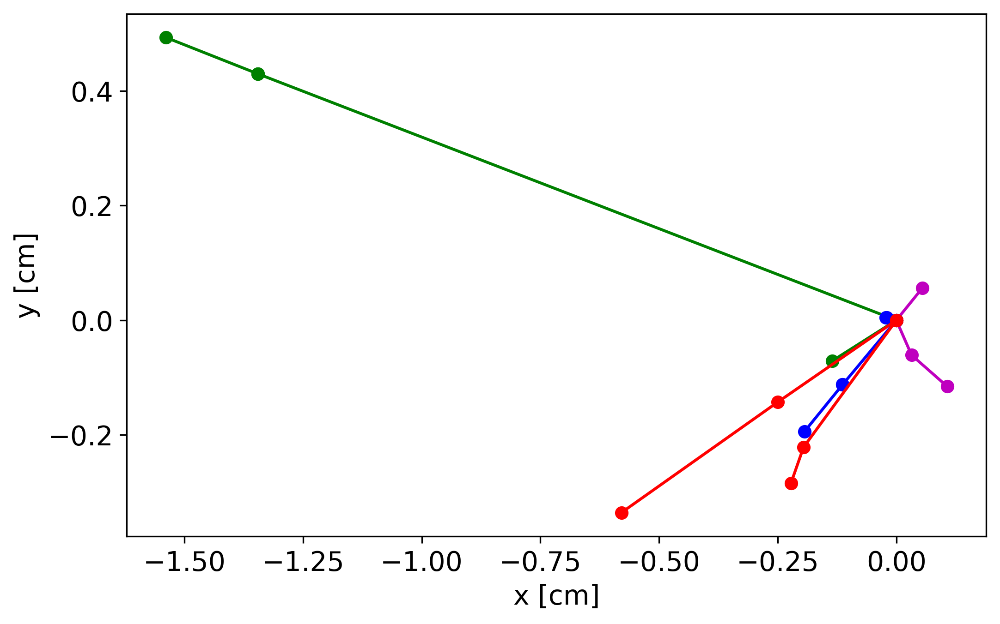

In [99]:
# Choosing a few displaced events to plot the xy positions of the displaced muon ancestors
data_ttj_nonpair = data_ttj_nonpair_e

event = data_ttj_nonpair[0].events[9]
muon = event.particles[0]
amuon = event.particles[1]
muon_anc = [event.particles[2],event.particles[3],event.particles[4],event.particles[5]]
amuon_anc = [event.particles[6]]
(muon_anc_vx, muon_anc_vy) = xy_positions(muon_anc)
(amuon_anc_vx, amuon_anc_vy) = xy_positions(amuon_anc)
plt.plot(muon_anc_vx,muon_anc_vy,'-mo')
plt.plot(amuon_anc_vx,amuon_anc_vy,'-mo')

event = data_ttj_nonpair[0].events[18]
muon = event.particles[0]
amuon = event.particles[1]
muon_anc = [event.particles[2],event.particles[3],event.particles[4]]
amuon_anc = [event.particles[5],event.particles[6],event.particles[7],event.particles[8],event.particles[9]]
(muon_anc_vx, muon_anc_vy) = xy_positions(muon_anc)
(amuon_anc_vx, amuon_anc_vy) = xy_positions(amuon_anc)
plt.plot(muon_anc_vx,muon_anc_vy,'-go')
plt.plot(amuon_anc_vx,amuon_anc_vy,'-go')

event = data_ttj_nonpair[0].events[22]
muon = event.particles[0]
amuon = event.particles[1]
muon_anc = [event.particles[2],event.particles[3],event.particles[4],event.particles[5]]
amuon_anc = [event.particles[6],event.particles[7],event.particles[8],event.particles[9],event.particles[10]]
(muon_anc_vx, muon_anc_vy) = xy_positions(muon_anc)
(amuon_anc_vx, amuon_anc_vy) = xy_positions(amuon_anc)
plt.plot(muon_anc_vx,muon_anc_vy,'-bo')
plt.plot(amuon_anc_vx,amuon_anc_vy,'-bo')

event = data_ttj_nonpair[0].events[39]
muon = event.particles[0]
amuon = event.particles[1]
muon_anc = [event.particles[2],event.particles[3],event.particles[4],event.particles[5],event.particles[6]]
amuon_anc = [event.particles[7],event.particles[8],event.particles[9],event.particles[10]]
(muon_anc_vx, muon_anc_vy) = xy_positions(muon_anc)
(amuon_anc_vx, amuon_anc_vy) = xy_positions(amuon_anc)
plt.plot(muon_anc_vx,muon_anc_vy,'-ro')
plt.plot(amuon_anc_vx,amuon_anc_vy,'-ro')

plt.xlabel("x [cm]")
plt.ylabel("y [cm]")

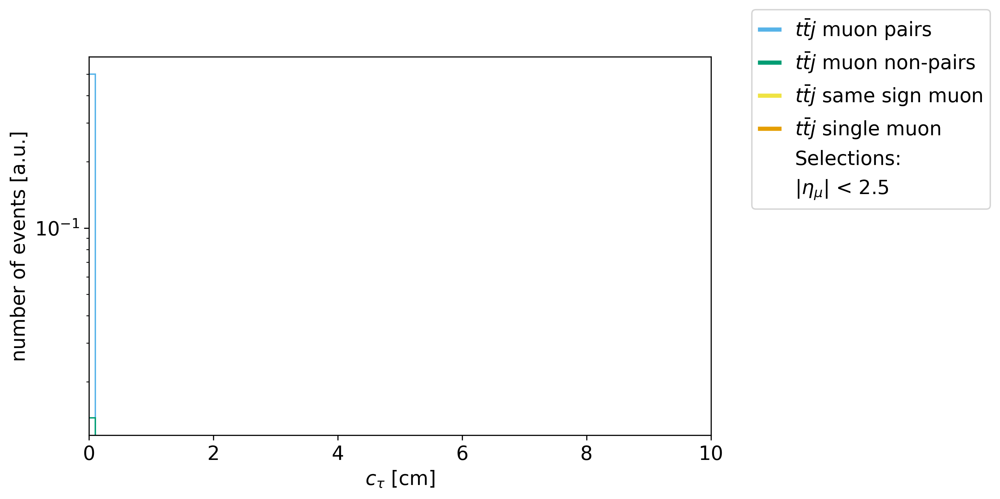

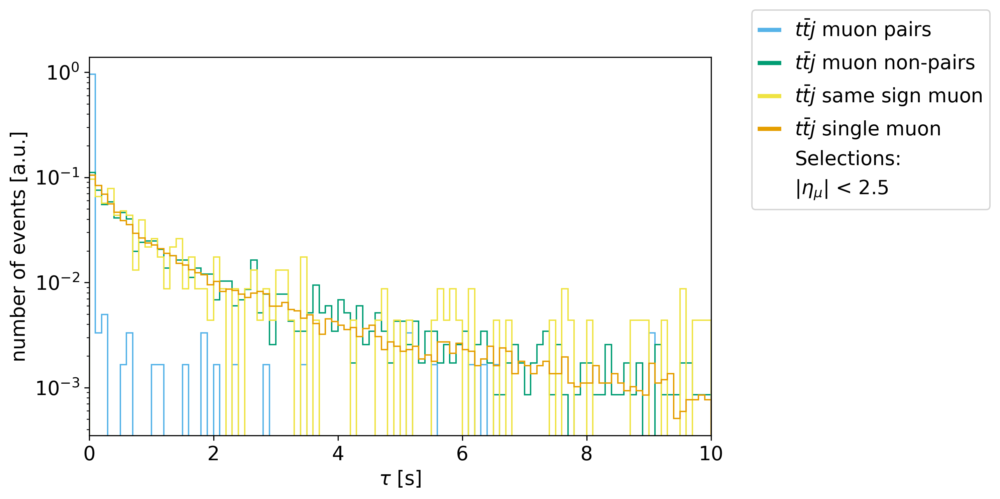

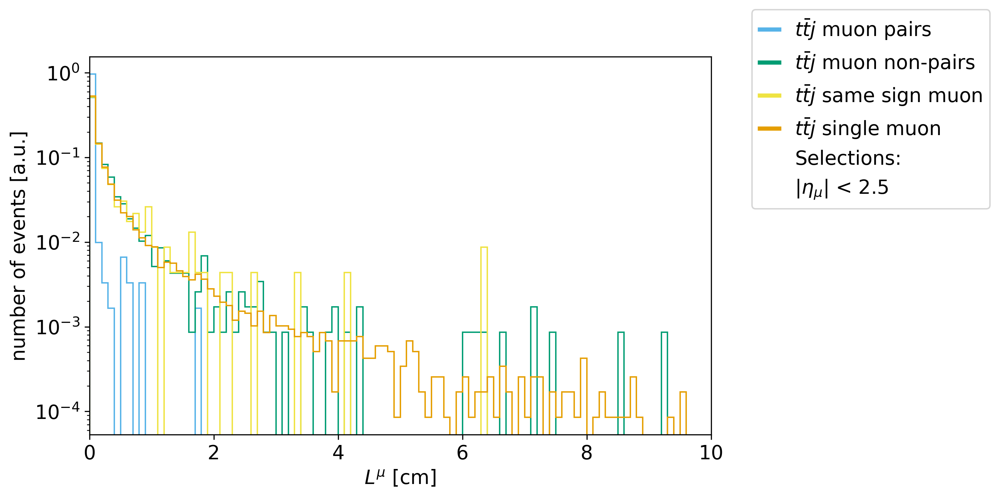

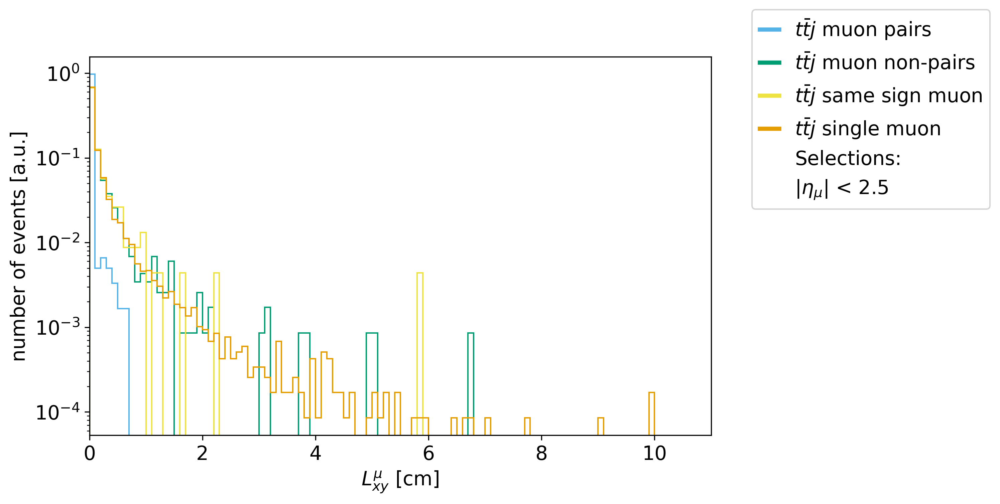

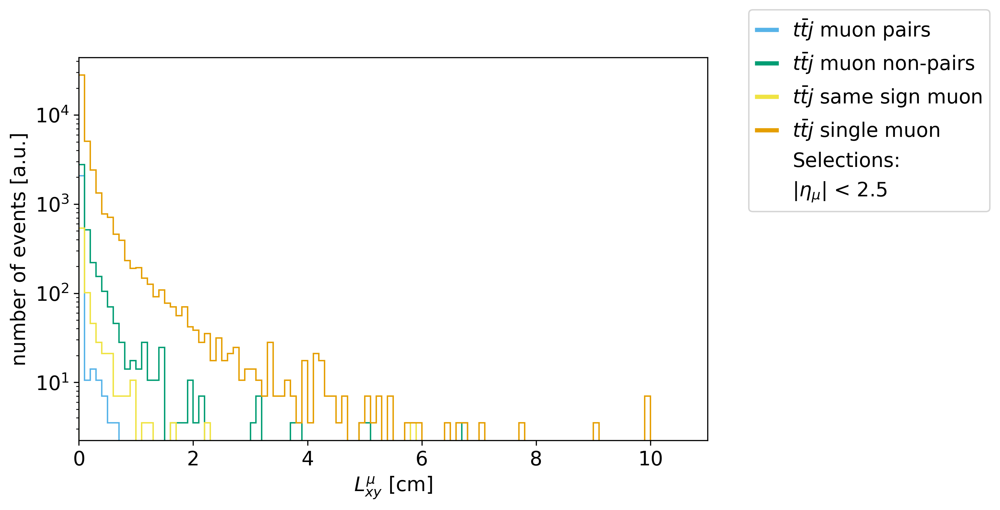

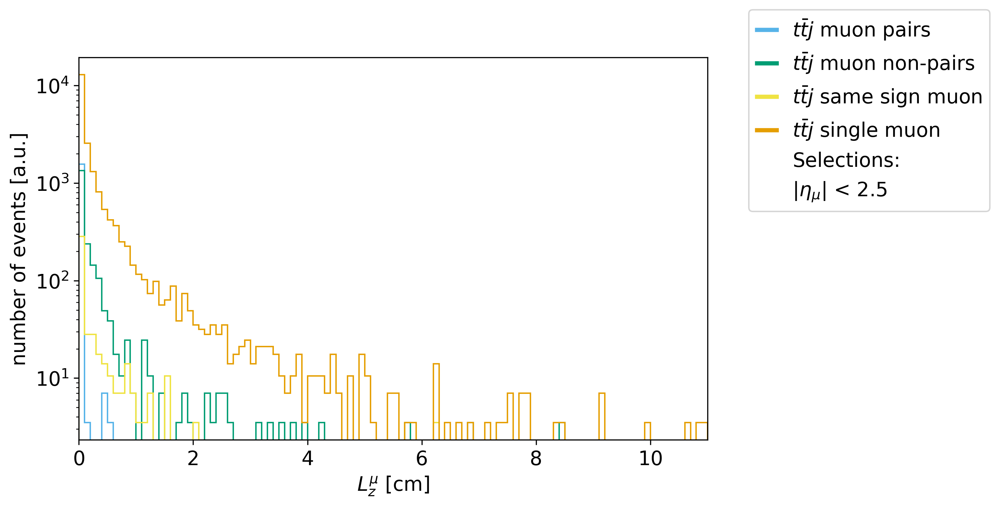

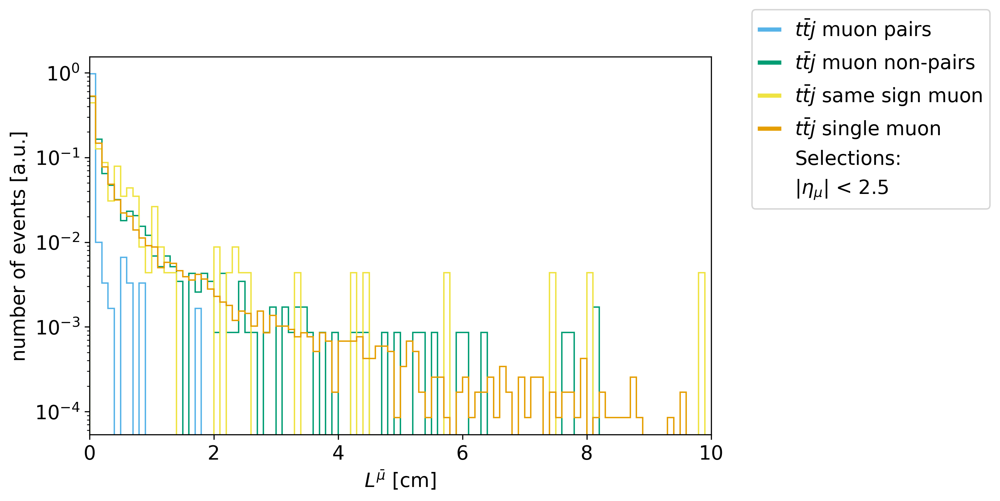

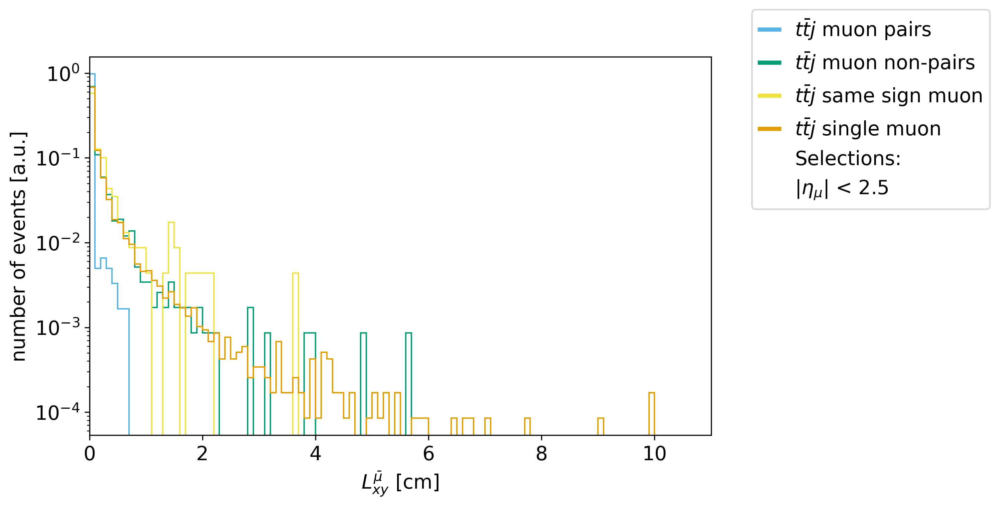

In [38]:
# Plotting displacement
cross_ttj = [cross_ttj[0],cross_ttj[0],cross_ttj[0],cross_ttj[0]]
N_ttj = [N_ttj[0],N_ttj[0],N_ttj[0],N_ttj[0]]
labels_ttj = [r'$t\bar{t}j$ muon pairs',r'$t\bar{t}j$ muon non-pairs',r'$t\bar{t}j$ same sign muon',r'$t\bar{t}j$ single muon']


# Muon ctau
mypl.hist1dcomp2(data("ctau",["muon"],"ttj"),[],[],labels_ttj,dirLabel["ctau"],nbins=100,customXlabels=[],
                 customXlim=[0,10],log_scale=True,selLabel=selLabel)
# Muon tau
mypl.hist1dcomp2(data("tau",["muon"],"ttj"),[],[],labels_ttj,dirLabel["tau"],nbins=100,customXlabels=[],
                 customXlim=[0,10],log_scale=True,selLabel=selLabel)

# Muon L
mypl.hist1dcomp2(data("vertex_3d",["muon"],"ttj"),[],[],labels_ttj,dirLabel["L_mu"],nbins=100,customXlabels=[],
                 customXlim=[0,10],log_scale=True,selLabel=selLabel)
mypl.hist1dcomp2(data("vertex_2d",["muon"],"ttj"),[],[],labels_ttj,dirLabel["Lxy_mu"],nbins=110,customXlabels=[],
                 customXlim=[0,11],log_scale=True,selLabel=selLabel)
mypl.hist1dcross(data("vertex_2d",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 dirLabel["Lxy_mu"],nbins=110,customXlabels=[],customXlim=[0,11],log_scale=True,selLabel=selLabel)
mypl.hist1dcross(data("vertex_z",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 dirLabel["Lz_mu"],nbins=110,customXlabels=[],customXlim=[0,11],log_scale=True,selLabel=selLabel)

# Antimuon L
mypl.hist1dcomp2(data("vertex_3d",["antimuon"],"ttj"),[],[],labels_ttj,dirLabel["L_amu"],nbins=100,customXlabels=[],
                 customXlim=[0,10],log_scale=True,selLabel=selLabel)
mypl.hist1dcomp2(data("vertex_2d",["antimuon"],"ttj"),[],[],labels_ttj,dirLabel["Lxy_amu"],nbins=110,customXlabels=[],
                 customXlim=[0,11],log_scale=True,selLabel=selLabel)


[This Dataset contains 21 events., This Dataset contains 115 events., This Dataset contains 21 events., This Dataset contains 2938 events.]
[This Dataset contains 2 events., This Dataset contains 12 events., This Dataset contains 3 events., This Dataset contains 883 events.]
[This Dataset contains 2 events., This Dataset contains 12 events., This Dataset contains 3 events., This Dataset contains 778 events.]
Eta cut


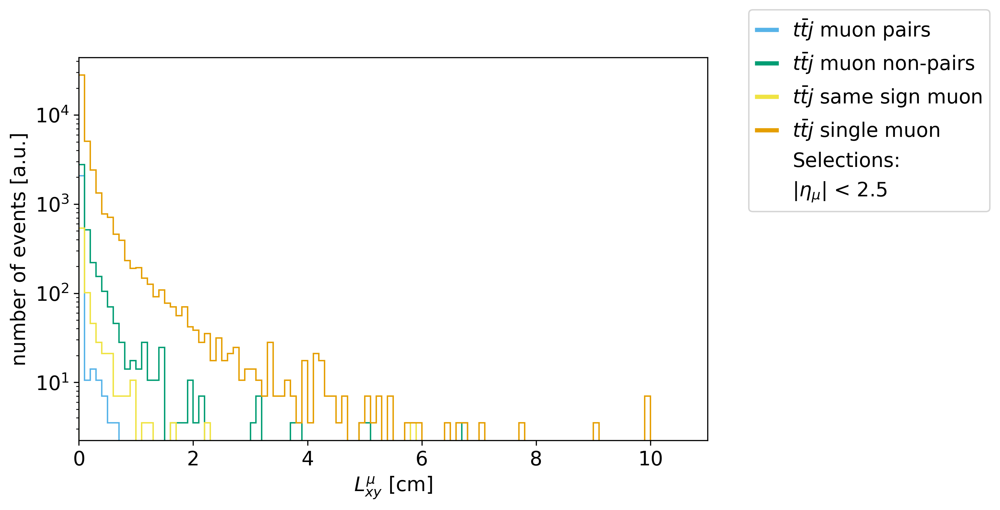

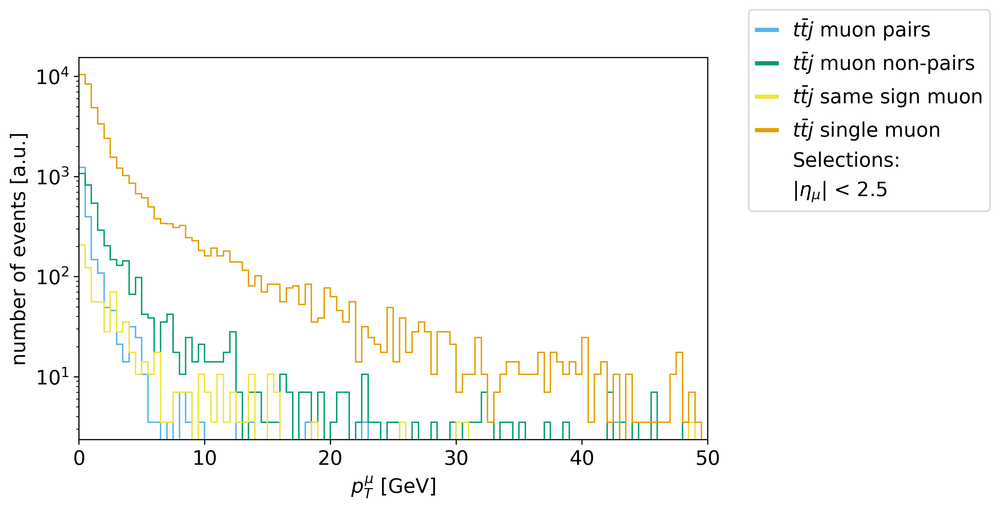

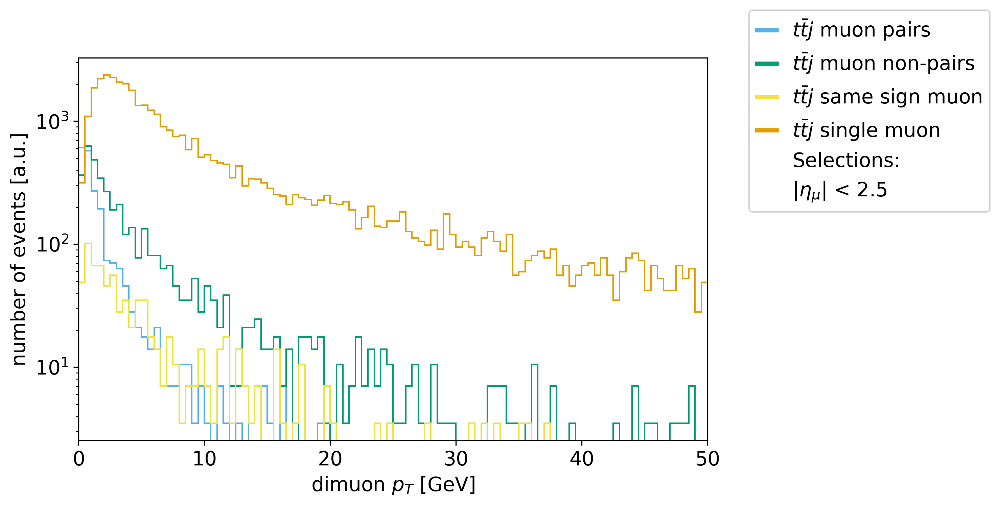

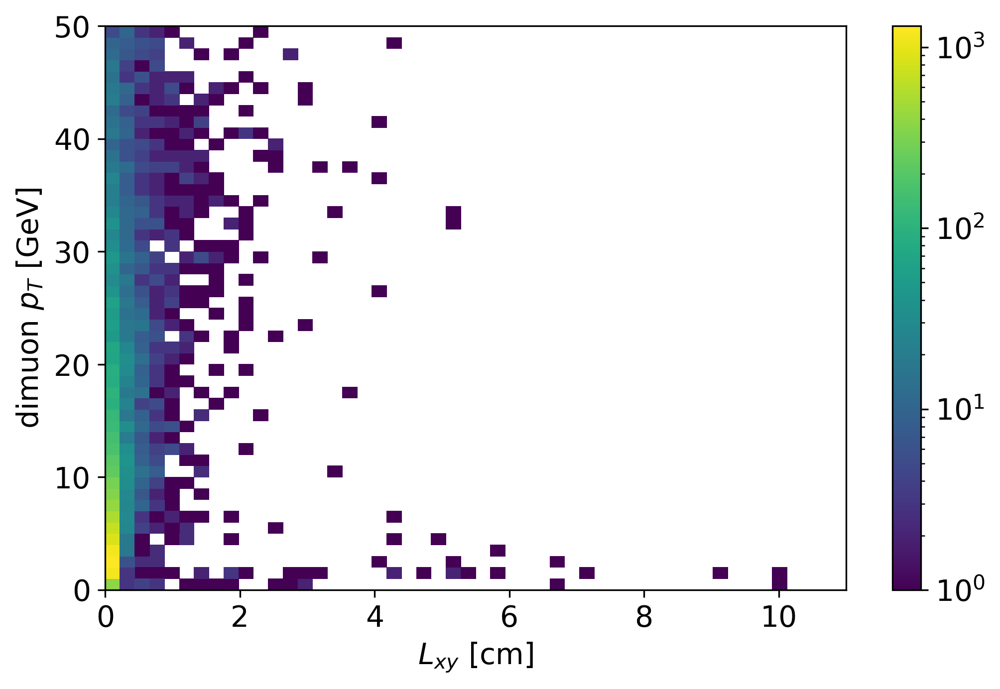

pT5 cut


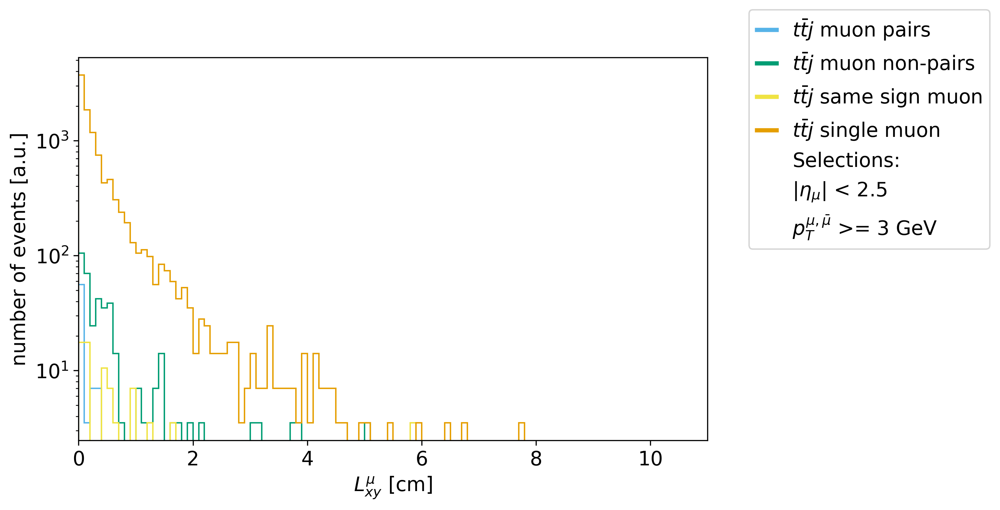

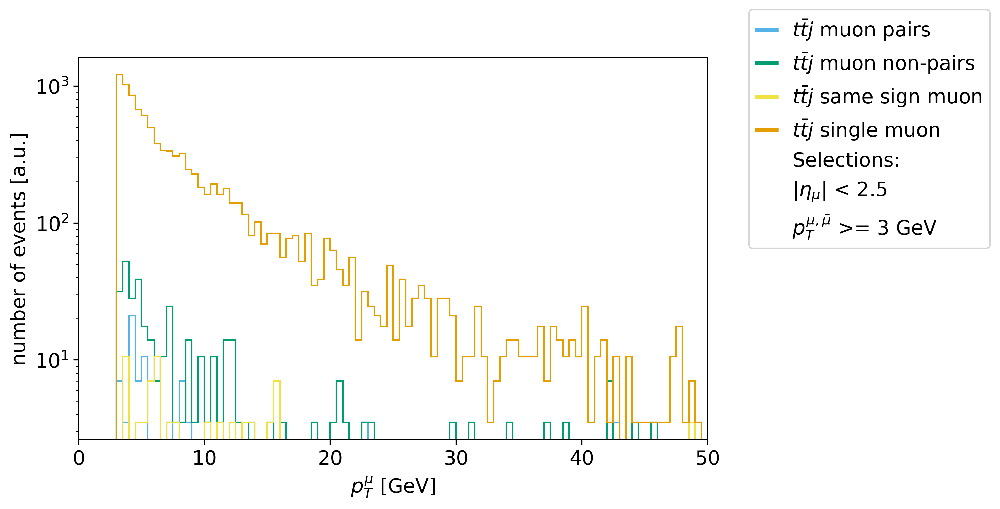

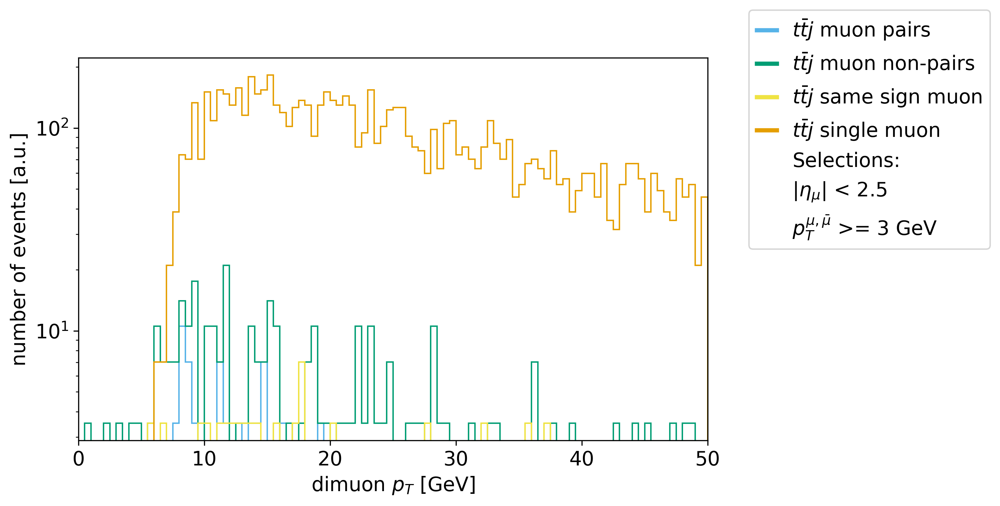

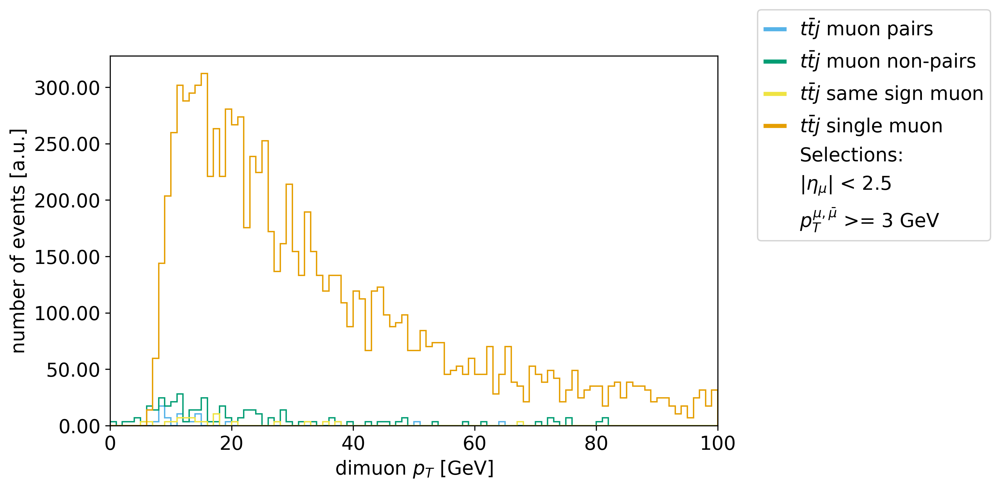

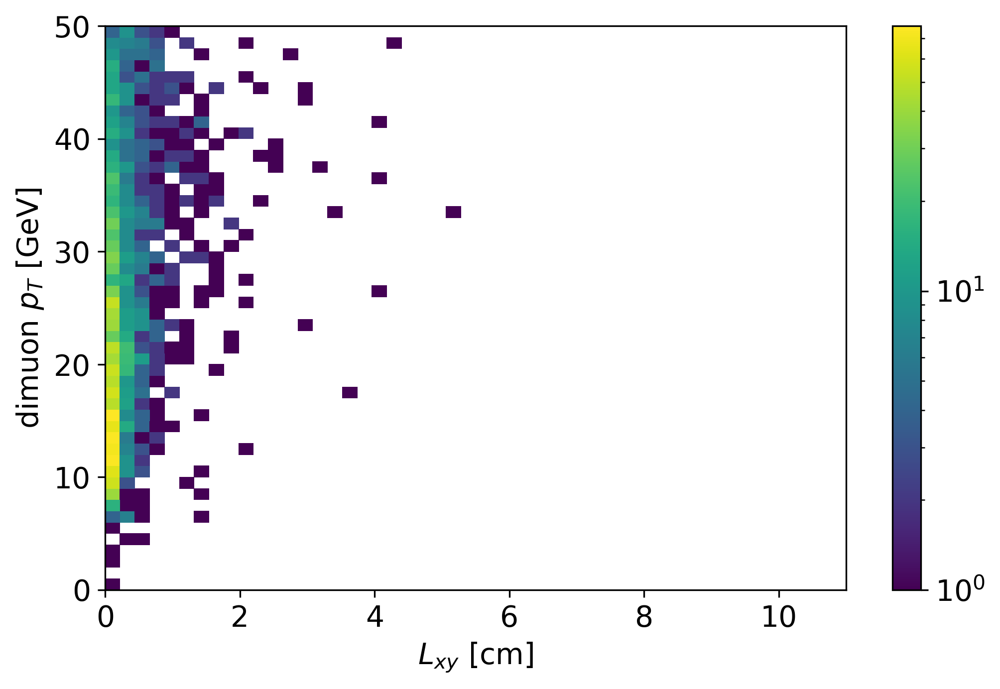

pT10 cut


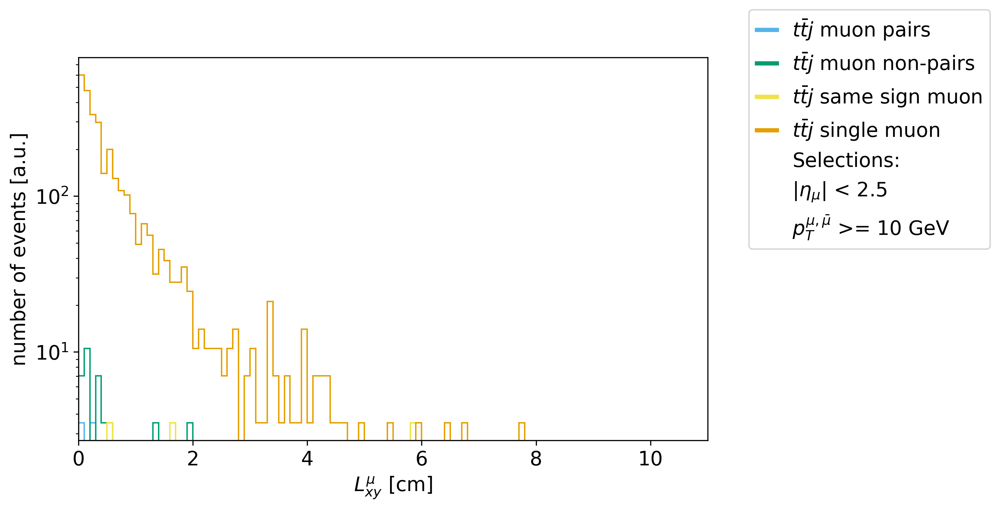

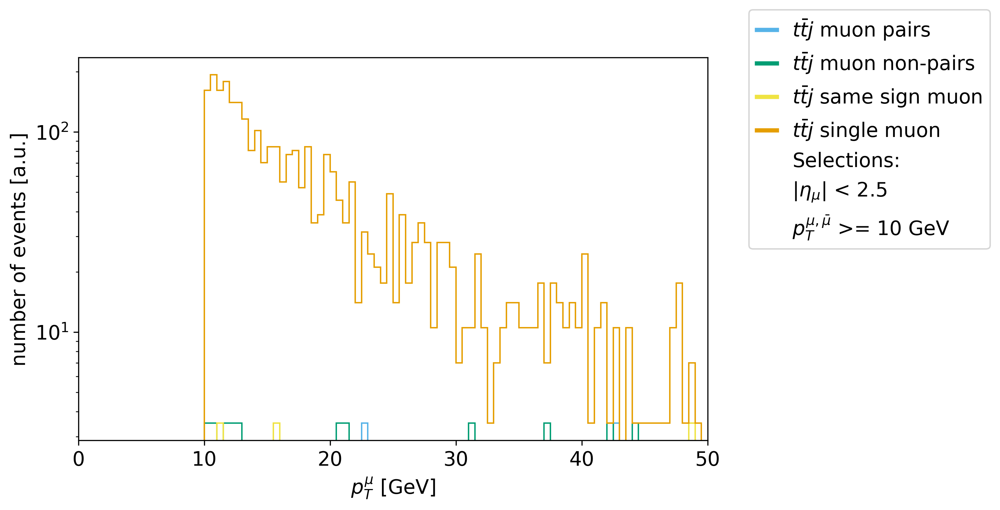

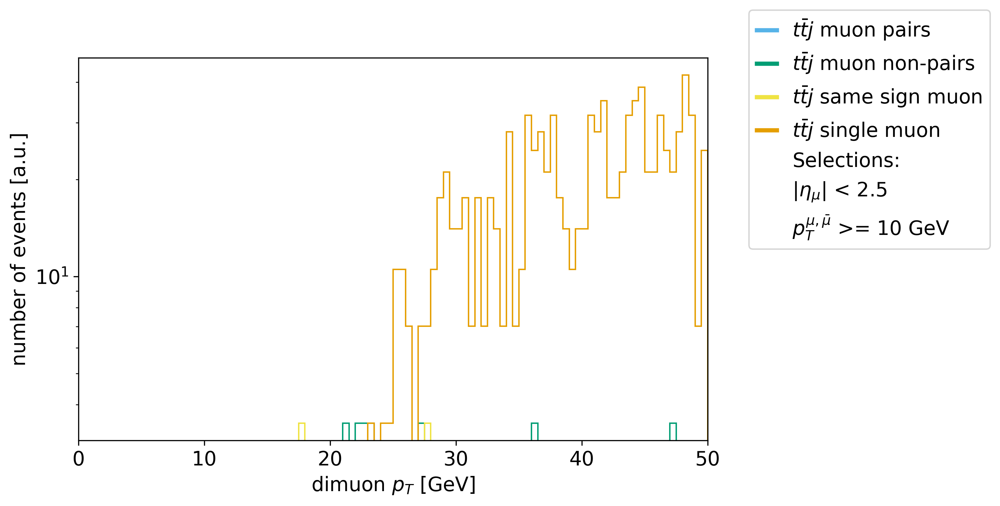

/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/lib64/python3.6/site-packages/matplotlib/colors.py:1210: RuntimeWarning: divide by zero encountered in log
  resdat -= np.log(vmin)
/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/lib64/python3.6/site-packages/matplotlib/colors.py:1211: RuntimeWarning: divide by zero encountered in log
  resdat /= (np.log(vmax) - np.log(vmin))


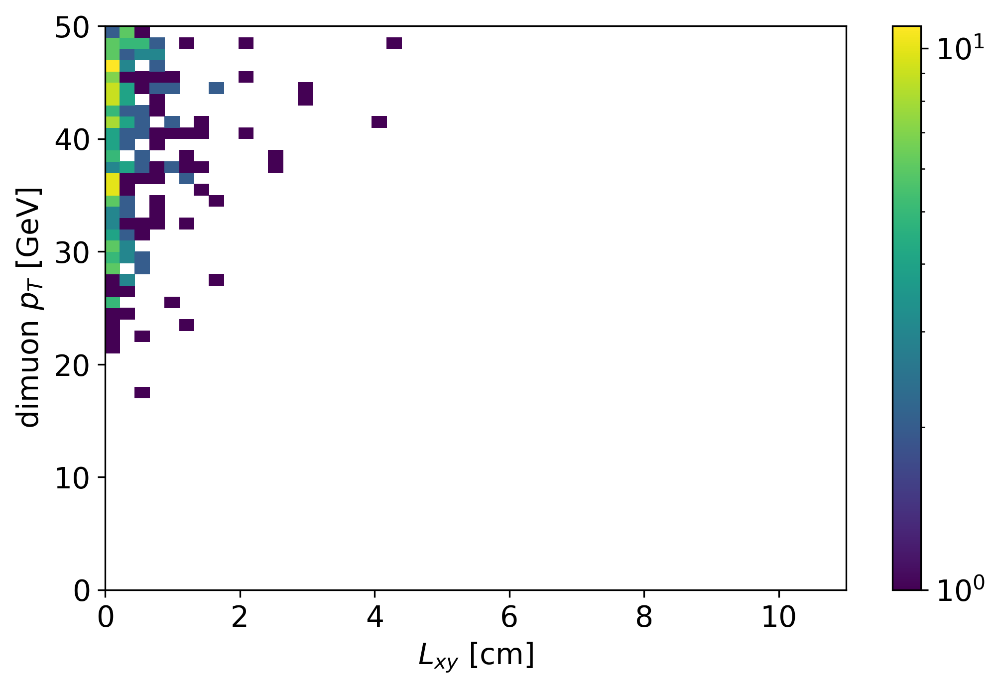

Removing singles data in last plot


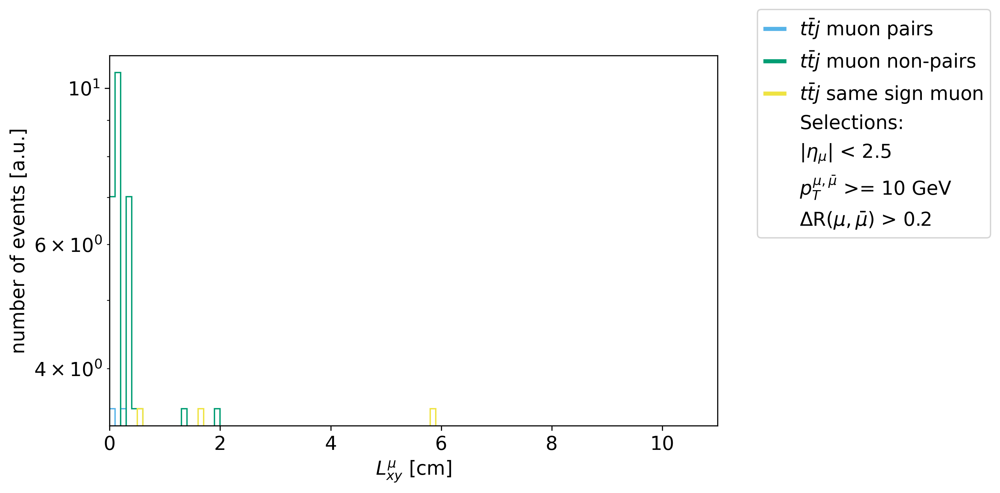

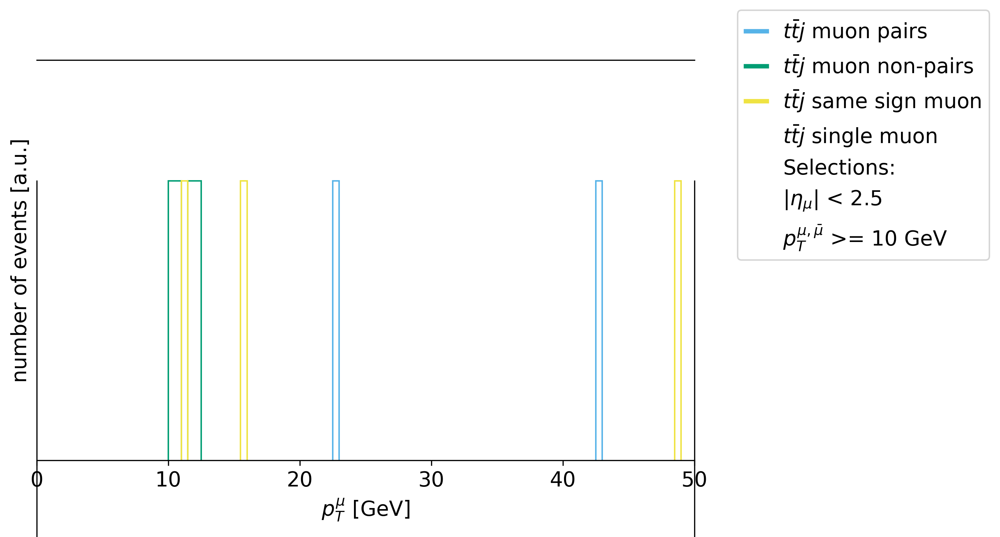

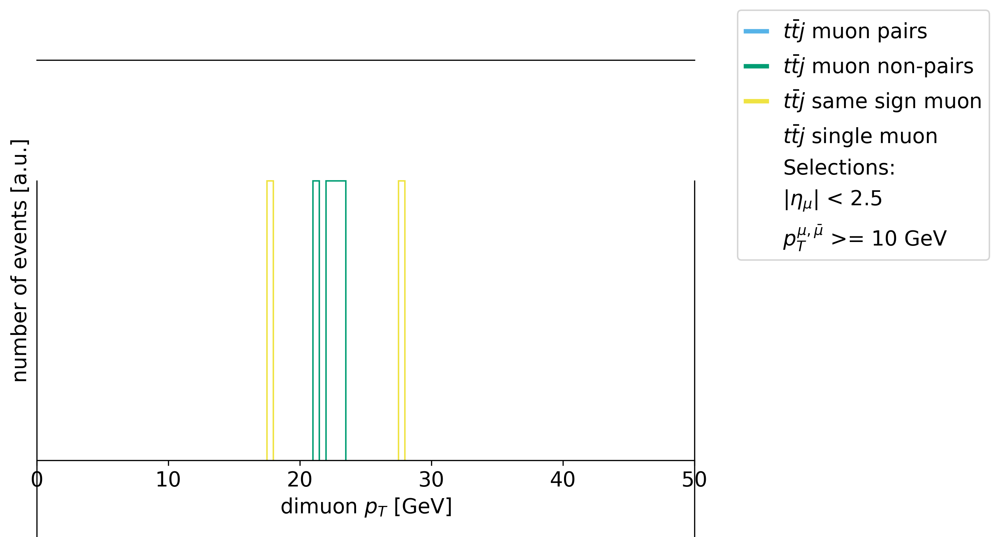

/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/lib64/python3.6/site-packages/matplotlib/colors.py:1210: RuntimeWarning: divide by zero encountered in log
  resdat -= np.log(vmin)
/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/lib64/python3.6/site-packages/matplotlib/colors.py:1211: RuntimeWarning: divide by zero encountered in log
  resdat /= (np.log(vmax) - np.log(vmin))


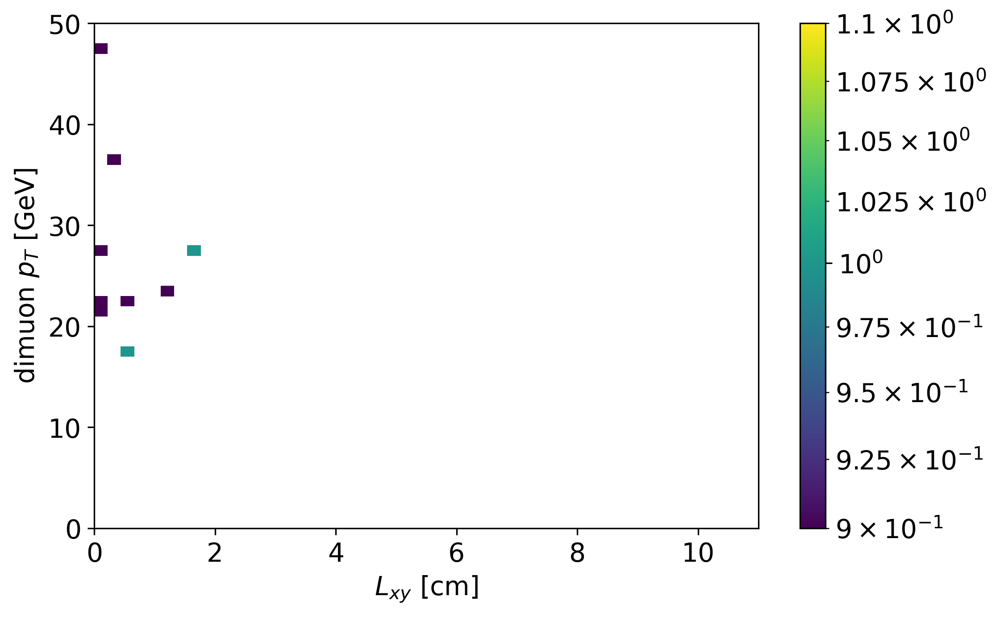

In [35]:
data_ttj = [data_ttj_pair_e[0], data_ttj_nonpair_e[0], data_ttj_ss_e[0], data_ttj_single_e[0]]
cross_ttj = [cross_ttj[0],cross_ttj[0],cross_ttj[0],cross_ttj[0]]
N_ttj = [N_ttj[0],N_ttj[0],N_ttj[0],N_ttj[0]]
labels_ttj = [r'$t\bar{t}j$ muon pairs',r'$t\bar{t}j$ muon non-pairs',r'$t\bar{t}j$ same sign muon',
              r'$t\bar{t}j$ single muon']

# Make a pT cut
sel = ((lambda x: x>=3),"pT", ["muon"])
data_ttj_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj]
sel = ((lambda x: x>=3),"pT", ["antimuon"])
data_ttj_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pT5]
print(data_ttj_pT5)
selLabel_pT5 = [r"$|\eta_{\mu}|$ < 2.5",r'$p_{T}^{\mu,\bar{\mu}}$ >= 3 GeV']

# Make a pT cut
sel = ((lambda x: x>=10),"pT", ["muon"])
data_ttj_pT10 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj]
sel = ((lambda x: x>=10),"pT", ["antimuon"])
data_ttj_pT10 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pT10]
print(data_ttj_pT10)
selLabel_pT10 = [r"$|\eta_{\mu}|$ < 2.5",r'$p_{T}^{\mu,\bar{\mu}}$ >= 10 GeV']

# Make a deltaR cut
sel = ((lambda x: x>0.2),"deltaR", ["muon","antimuon"])
data_ttj_pT10_dR = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pT10]
print(data_ttj_pT10_dR)
selLabel_pT10_dR = [r"$|\eta_{\mu}|$ < 2.5",r'$p_{T}^{\mu,\bar{\mu}}$ >= 10 GeV',r'$\Delta$R($\mu,\bar{\mu}$) > 0.2']

data_ttj_e = data_ttj.copy()

N_ttj = [N_ttj[0],N_ttj[0],N_ttj[0],N_ttj[0]]
labels_ttj = [r'$t\bar{t}j$ muon pairs',r'$t\bar{t}j$ muon non-pairs',r'$t\bar{t}j$ same sign muon',
              r'$t\bar{t}j$ single muon']

data_ttj = data_ttj
print("Eta cut")
mypl.hist1dcross(data("vertex_2d",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 dirLabel["Lxy_mu"],nbins=110,customXlabels=[],customXlim=[0,11],log_scale=True,selLabel=selLabel)
mypl.hist1dcross(data("pT",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 dirLabel["pT_mu"],nbins=100,customXlabels=[],customXlim=[0,50],log_scale=True,selLabel=selLabel)
mypl.hist1dcross(data("inv_pT",["muon","antimuon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 r'dimuon $p_{T}$ [GeV]',nbins=100,customXlabels=[],customXlim=[0,50],log_scale=True,selLabel=selLabel)
plot_lxy_pt("ttj")
data_ttj = data_ttj_pT5
print("pT5 cut")
mypl.hist1dcross(data("vertex_2d",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 dirLabel["Lxy_mu"],nbins=110,customXlabels=[],customXlim=[0,11],log_scale=True,selLabel=selLabel_pT5)
mypl.hist1dcross(data("pT",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 dirLabel["pT_mu"],nbins=100,customXlabels=[],customXlim=[0,50],log_scale=True,selLabel=selLabel_pT5)
mypl.hist1dcross(data("inv_pT",["muon","antimuon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 r'dimuon $p_{T}$ [GeV]',nbins=100,customXlabels=[],customXlim=[0,50],log_scale=True,selLabel=selLabel_pT5)
mypl.hist1dcross(data("inv_pT",["muon","antimuon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 r'dimuon $p_{T}$ [GeV]',nbins=100,customXlabels=[],customXlim=[0,100],log_scale=False,selLabel=selLabel_pT5)
plot_lxy_pt("ttj")
data_ttj = data_ttj_pT10
print("pT10 cut")
mypl.hist1dcross(data("vertex_2d",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 dirLabel["Lxy_mu"],nbins=110,customXlabels=[],customXlim=[0,11],log_scale=True,selLabel=selLabel_pT10)
mypl.hist1dcross(data("pT",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 dirLabel["pT_mu"],nbins=100,customXlabels=[],customXlim=[0,50],log_scale=True,selLabel=selLabel_pT10)
mypl.hist1dcross(data("inv_pT",["muon","antimuon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 r'dimuon $p_{T}$ [GeV]',nbins=100,customXlabels=[],customXlim=[0,50],log_scale=True,selLabel=selLabel_pT10)
plot_lxy_pt("ttj")
print("Removing singles data in last plot")
data_ttj = [data_ttj_pT10_dR[0],data_ttj_pT10_dR[1],data_ttj_pT10_dR[2]]
labels_ttj_dR = [labels_ttj[0],labels_ttj[1],labels_ttj[2]]
mypl.hist1dcross(data("vertex_2d",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj_dR,
                 dirLabel["Lxy_mu"],nbins=110,customXlabels=[],customXlim=[0,11],log_scale=True,selLabel=selLabel_pT10_dR)
mypl.hist1dcross(data("pT",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 dirLabel["pT_mu"],nbins=100,customXlabels=[],customXlim=[0,50],log_scale=True,selLabel=selLabel_pT10_dR)
mypl.hist1dcross(data("inv_pT",["muon","antimuon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                 r'dimuon $p_{T}$ [GeV]',nbins=100,customXlabels=[],customXlim=[0,50],log_scale=True,selLabel=selLabel_pT10_dR)
plot_lxy_pt("ttj")
data_ttj = data_ttj_e


In [39]:
data_ttj_2muons1 = dc.Dataset.concaternate_datasets(data_ttj_pair_e[0],data_ttj_nonpair_e[0])
data_ttj_2muons = [dc.Dataset.concaternate_datasets(data_ttj_2muons1,data_ttj_ss_e[0])]
data_ttj = [data_ttj_pair_e[0], data_ttj_nonpair_e[0], data_ttj_ss_e[0], data_ttj_2muons[0], data_ttj_single_e[0]]
cross_ttj = [cross_ttj[0],cross_ttj[0],cross_ttj[0],cross_ttj[0],cross_ttj[0]]
N_ttj = [N_ttj[0],N_ttj[0],N_ttj[0],N_ttj[0],N_ttj[0]]
labels_ttj = [r'$t\bar{t}j$ muon pairs',r'$t\bar{t}j$ muon non-pairs',r'$t\bar{t}j$ same sign muon',
              r'$t\bar{t}j$',r'$t\bar{t}j$ single muon']

# Make a pT cut
sel = ((lambda x: x>=3),"pT", ["muon"])
data_ttj_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj]
sel = ((lambda x: x>=3),"pT", ["antimuon"])
data_ttj_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pT5]
print(data_ttj_pT5)
selLabel_pT5 = [r"$|\eta_{\mu}|$ < 2.5",r'$p_{T}^{\mu,\bar{\mu}}$ >= 3 GeV']

# Make a ctau cut
sel = ((lambda x: x<0.2),"vertex_2d", ["muon"])
data_ttj_l0p2 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj]
data_ttj_l0p2_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pT5]
sel = ((lambda x: x<0.2),"vertex_2d", ["antimuon"])
data_ttj_l0p2 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_l0p2]
data_ttj_l0p2_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_l0p2_pT5]

sel = ((lambda x: x>=0.2 and x<1.0),"vertex_2d", ["muon"])
data_ttj_l1 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj]
data_ttj_l1_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pT5]
sel = ((lambda x: x>=0.2 and x<1.0),"vertex_2d", ["antimuon"])
data_ttj_l1 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_l1]
data_ttj_l1_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_l1_pT5]

sel = ((lambda x: x>=1.0 and x<2.4),"vertex_2d", ["muon"])
data_ttj_l2p4 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj]
data_ttj_l2p4_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pT5]
sel = ((lambda x: x>=1.0 and x<2.4),"vertex_2d", ["antimuon"])
data_ttj_l2p4 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_l2p4]
data_ttj_l2p4_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_l2p4_pT5]

sel = ((lambda x: x>=2.4 and x<3.1),"vertex_2d", ["muon"])
data_ttj_l3p1 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj]
data_ttj_l3p1_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pT5]
sel = ((lambda x: x>=2.4 and x<3.1),"vertex_2d", ["antimuon"])
data_ttj_l3p1 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_l3p1]
data_ttj_l3p1_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_l3p1_pT5]

sel = ((lambda x: x>=3.1 and x<7.0),"vertex_2d", ["muon"])
data_ttj_l7 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj]
data_ttj_l7_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pT5]
sel = ((lambda x: x>3.1 and x<7.0),"vertex_2d", ["antimuon"])
data_ttj_l7 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_l7]
data_ttj_l7_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_l7_pT5]

sel = ((lambda x: x>=7.0 and x<11.0),"vertex_2d", ["muon"])
data_ttj_l11 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj]
data_ttj_l11_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pT5]
sel = ((lambda x: x>=7.0 and x<11.0),"vertex_2d", ["antimuon"])
data_ttj_l11 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_l11]
data_ttj_l11_pT5 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_l11_pT5]

data_ttj_lcuts = [data_ttj_l0p2,data_ttj_l1,data_ttj_l2p4,data_ttj_l3p1,data_ttj_l7,data_ttj_l11]
data_ttj_lcuts_pT5 = [data_ttj_l0p2_pT5,data_ttj_l1_pT5,data_ttj_l2p4_pT5,data_ttj_l3p1_pT5,data_ttj_l7_pT5,
                      data_ttj_l11_pT5]
print(data_ttj_lcuts)
print(data_ttj_lcuts_pT5)

[This Dataset contains 21 events., This Dataset contains 115 events., This Dataset contains 21 events., This Dataset contains 157 events., This Dataset contains 2938 events.]
[[This Dataset contains 594 events., This Dataset contains 809 events., This Dataset contains 133 events., This Dataset contains 1536 events., This Dataset contains 9458 events.], [This Dataset contains 11 events., This Dataset contains 76 events., This Dataset contains 13 events., This Dataset contains 100 events., This Dataset contains 1852 events.], [This Dataset contains 0 events., This Dataset contains 6 events., This Dataset contains 2 events., This Dataset contains 8 events., This Dataset contains 314 events.], [This Dataset contains 0 events., This Dataset contains 0 events., This Dataset contains 0 events., This Dataset contains 0 events., This Dataset contains 38 events.], [This Dataset contains 0 events., This Dataset contains 1 events., This Dataset contains 0 events., This Dataset contains 1 events., 

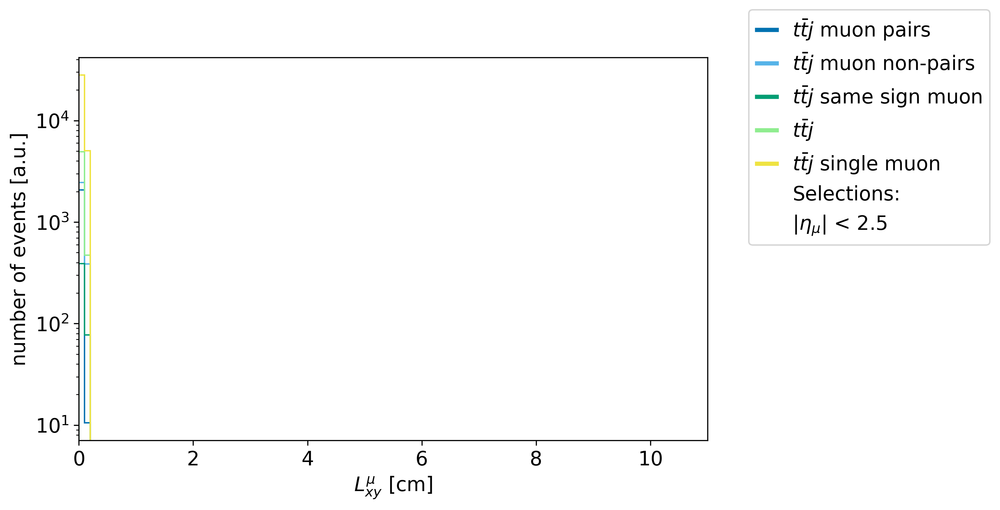

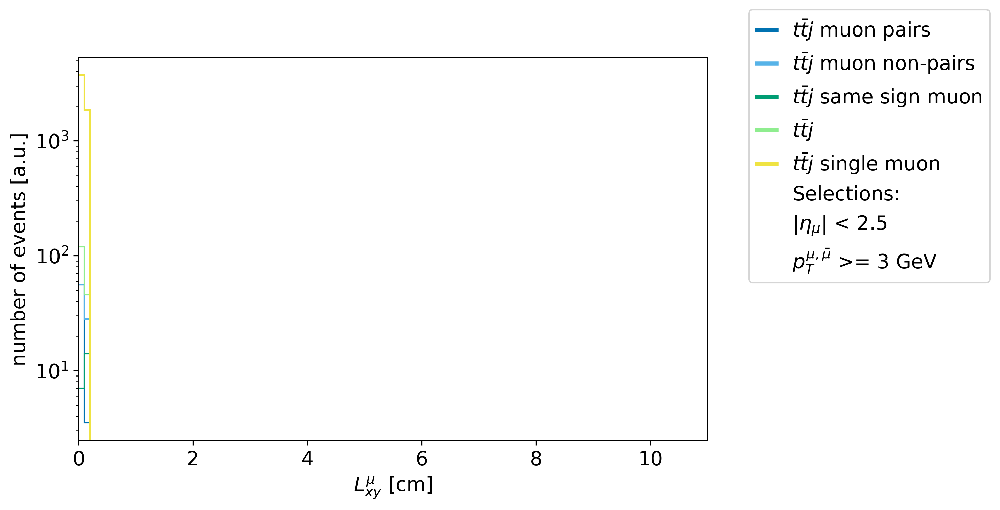

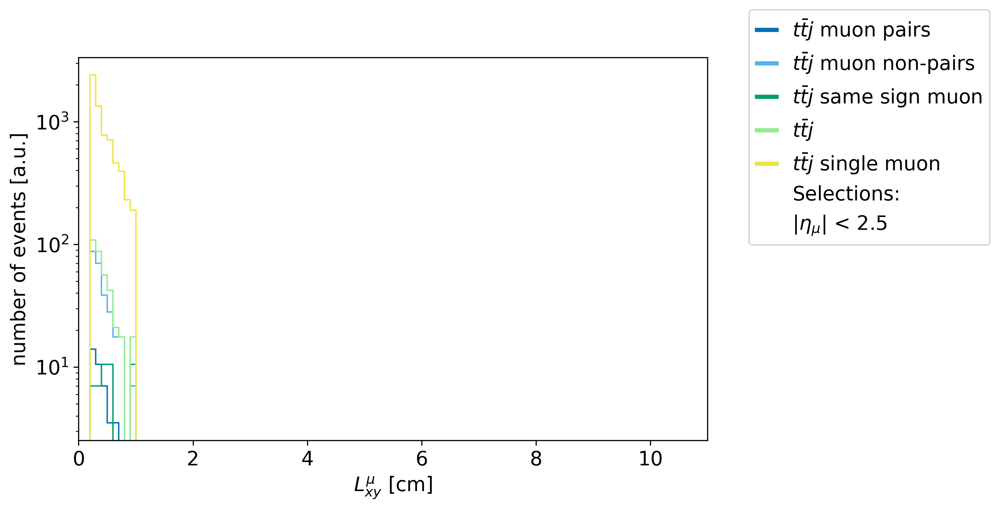

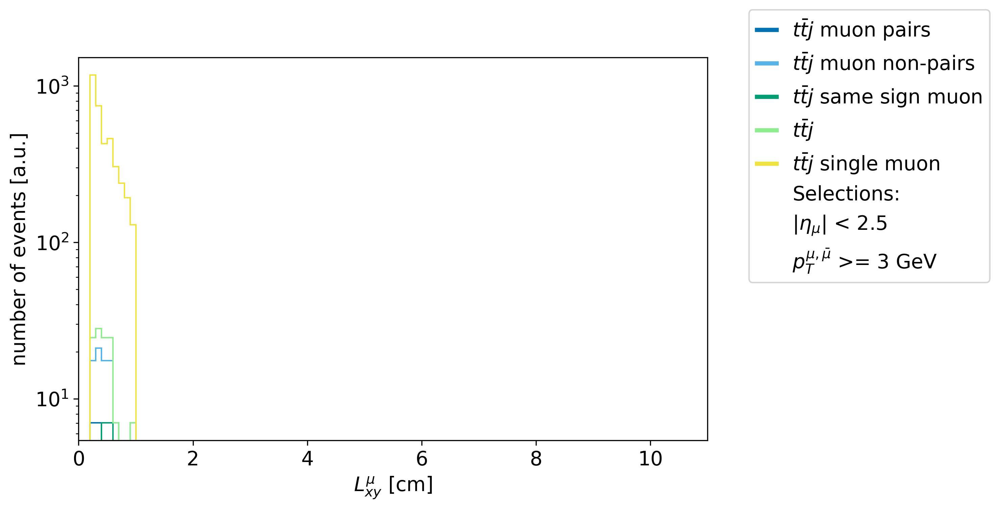

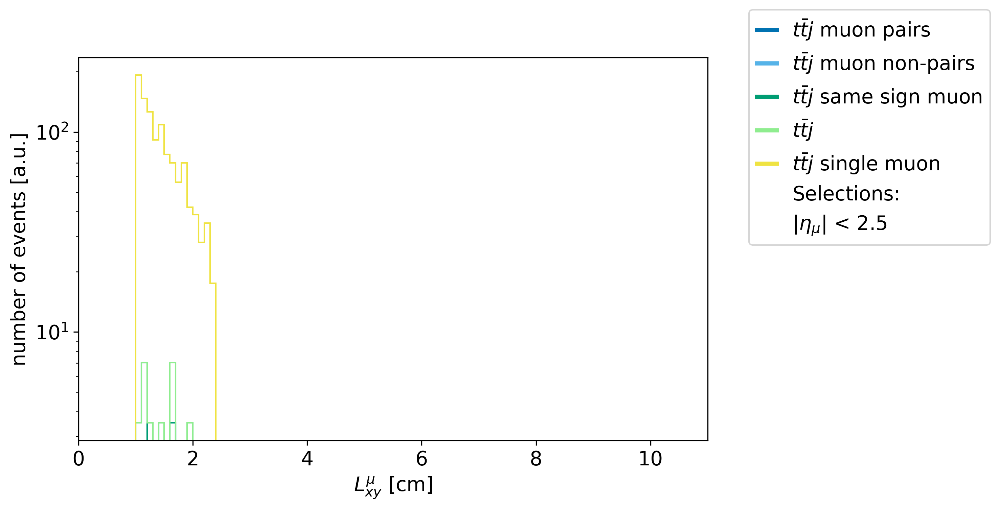

...

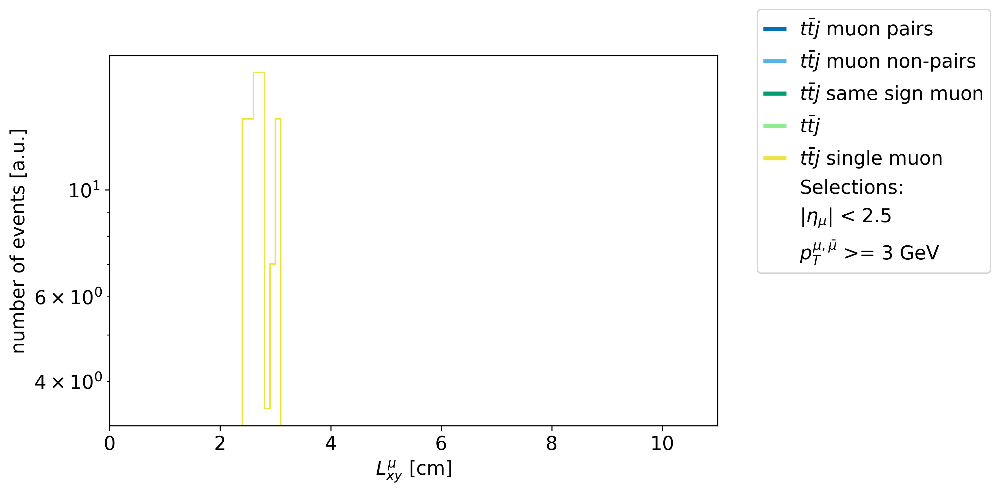

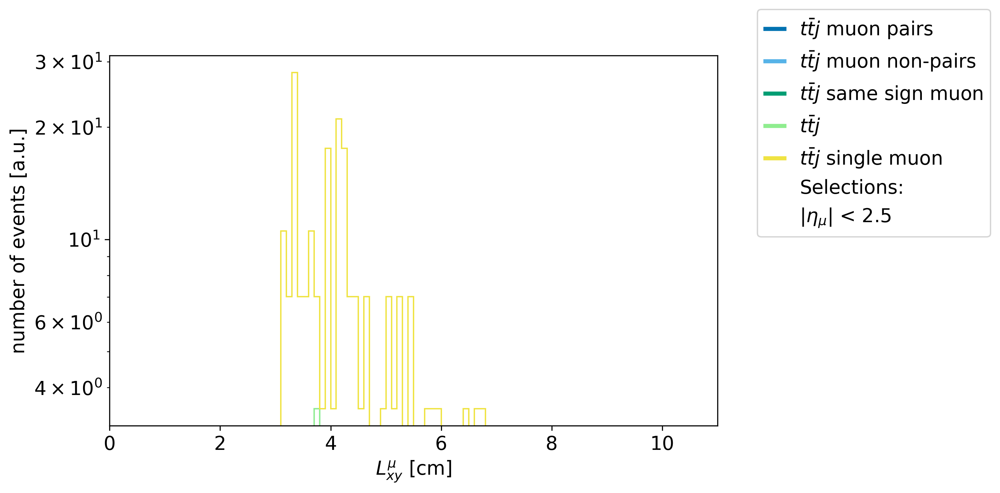

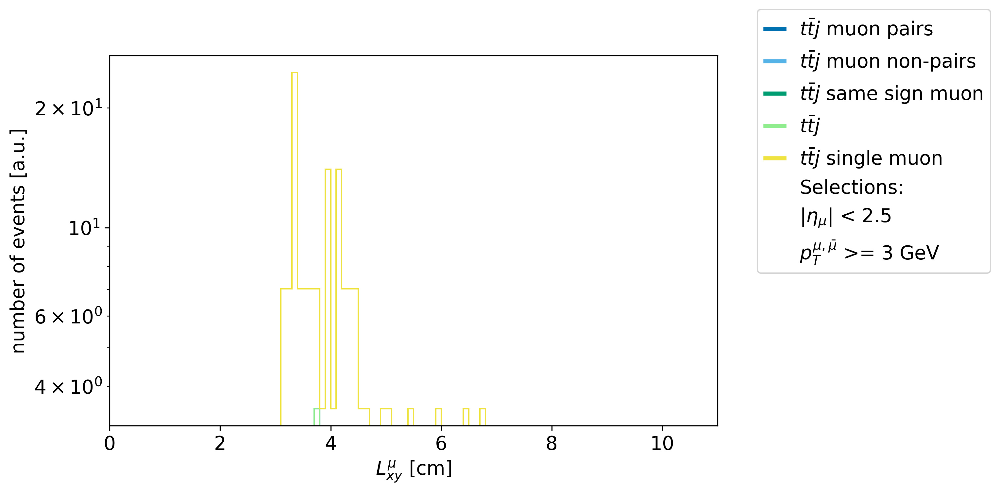

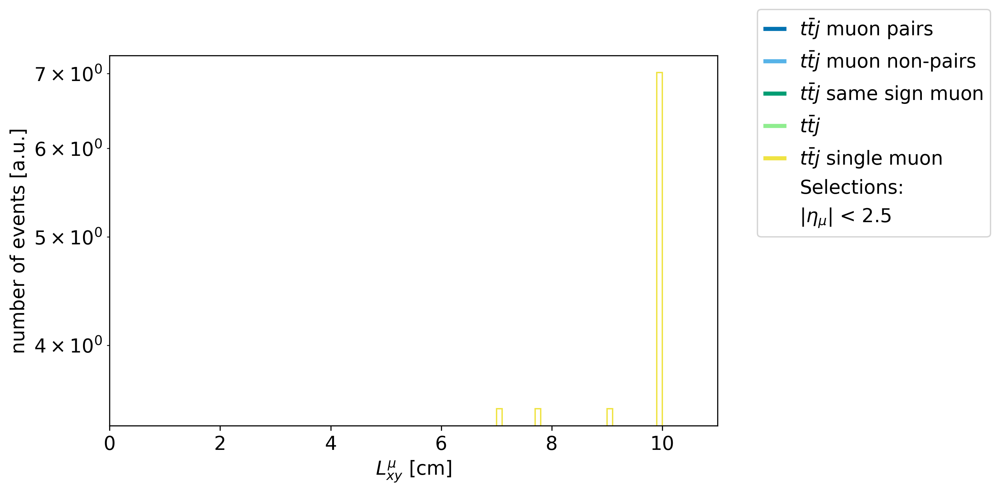

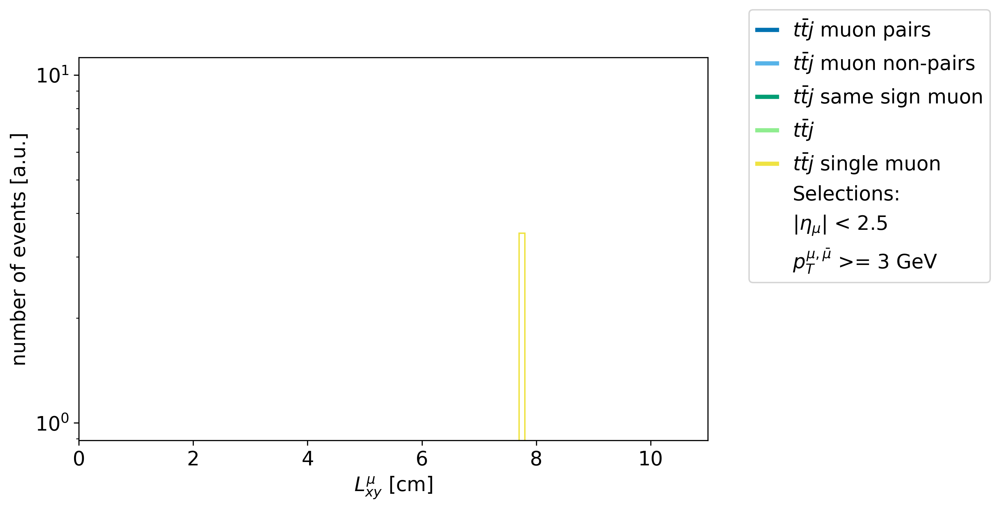

In [40]:
for i in range(len(data_ttj_lcuts)):
    data_ttj = data_ttj_lcuts[i]
    mypl.hist1dcross(data("vertex_2d",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                     dirLabel["Lxy_mu"],nbins=110,customXlabels=[],customXlim=[0,11],log_scale=True,selLabel=selLabel)
    data_ttj = data_ttj_lcuts_pT5[i]
    mypl.hist1dcross(data("vertex_2d",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj,
                     dirLabel["Lxy_mu"],nbins=110,customXlabels=[],customXlim=[0,11],log_scale=True,selLabel=selLabel_pT5)

Plots of vertex_2d and invariant mass with different lxy cuts. In order: ttj_pairs, ttj_nonpairs,  ttj_ss, ttj, ttj_single


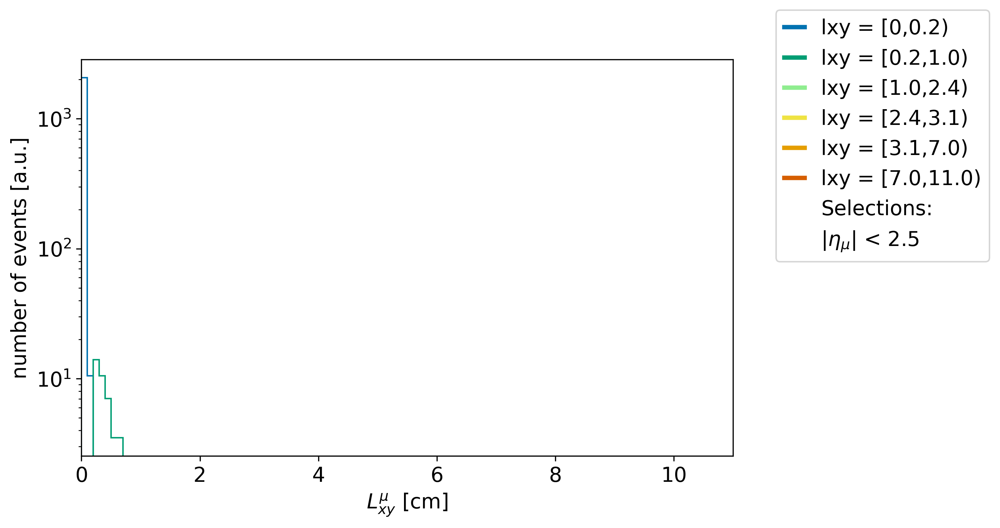

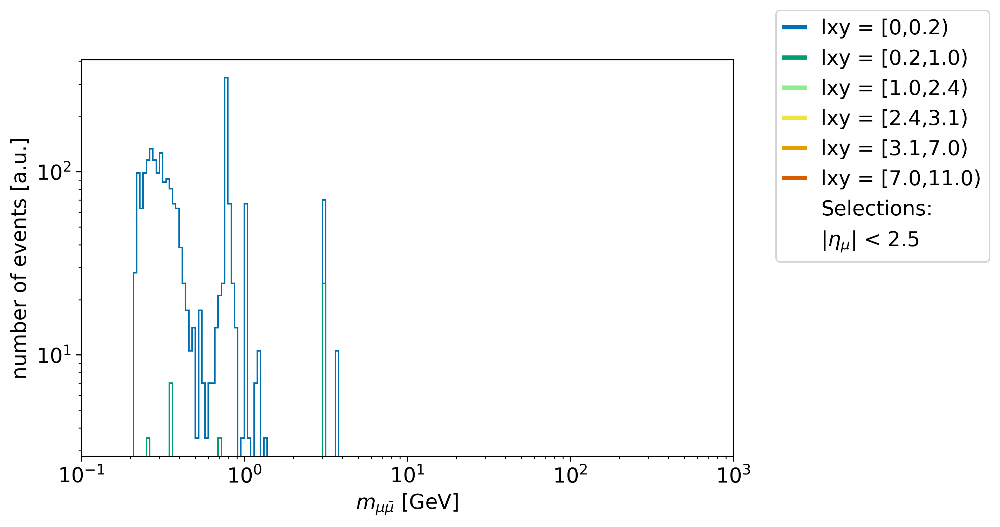

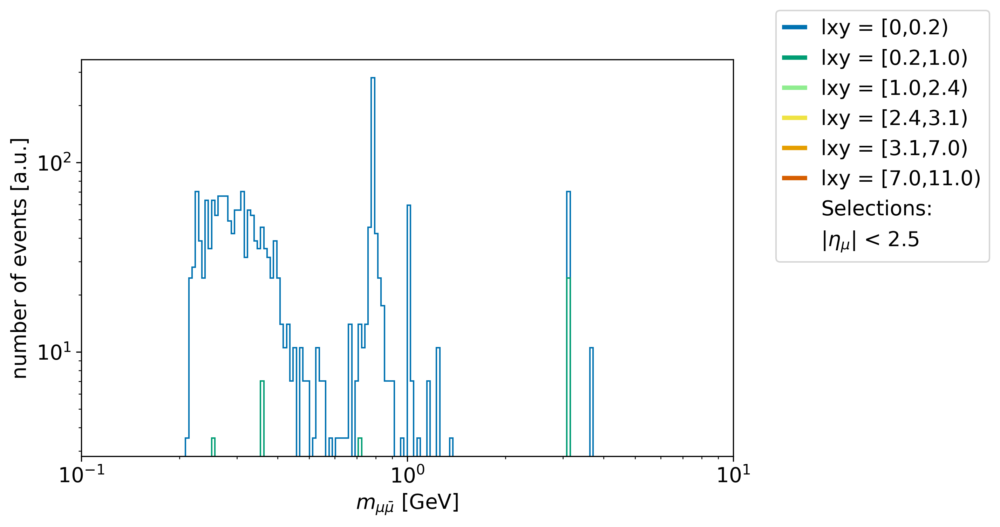

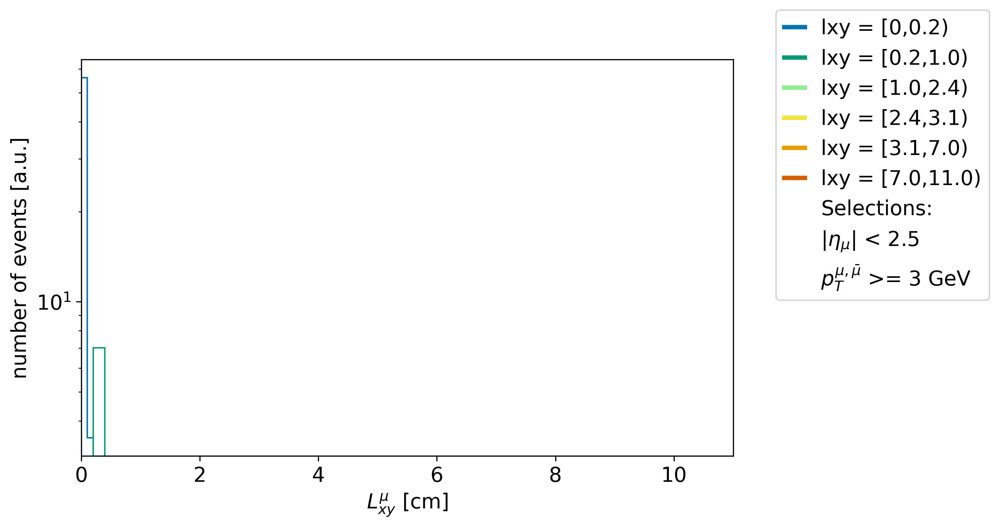

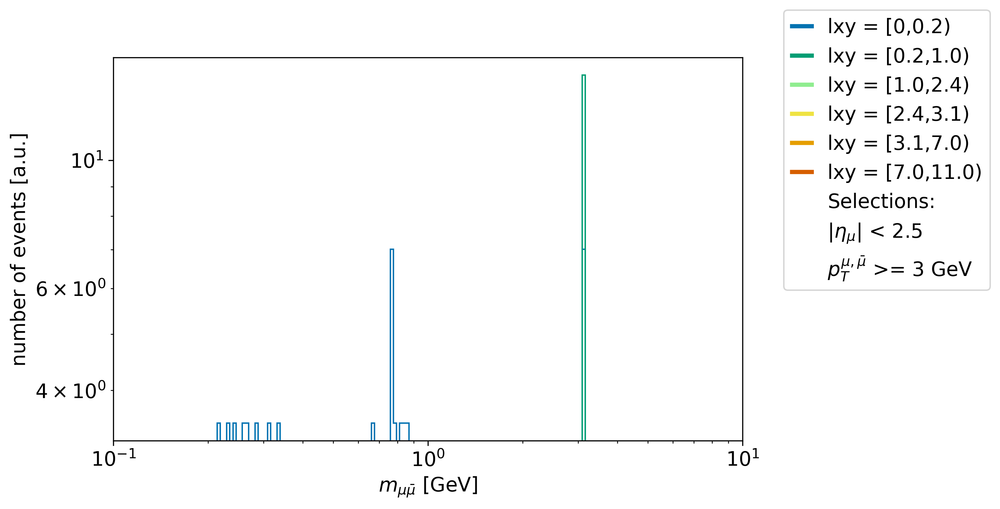

...

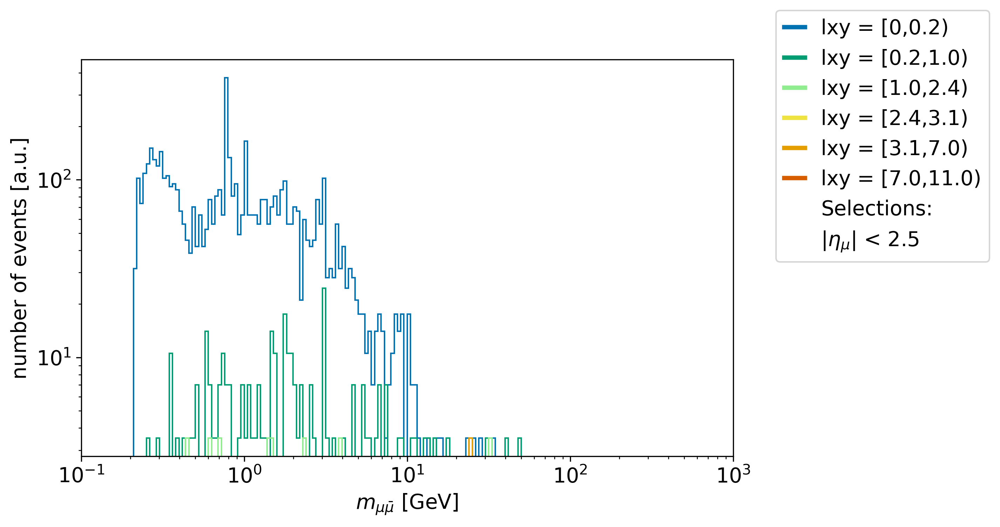

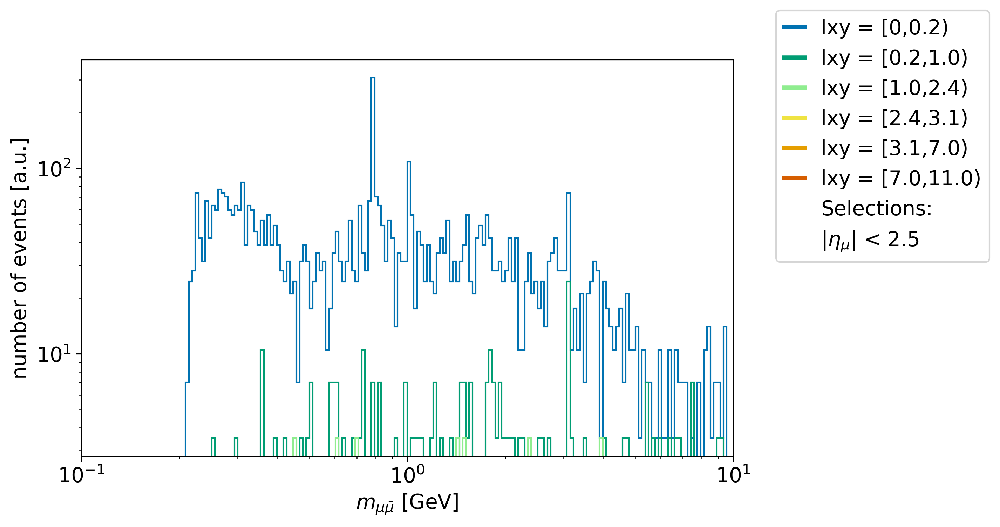

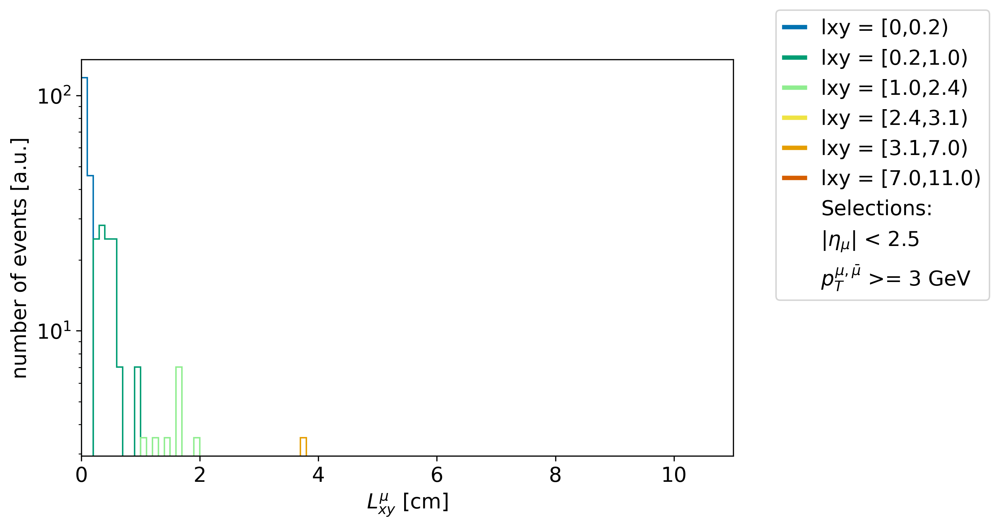

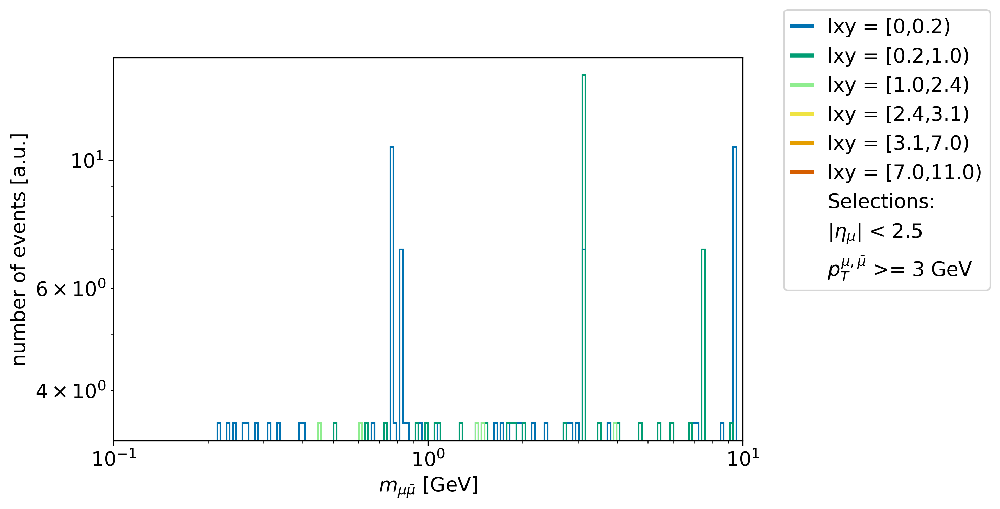

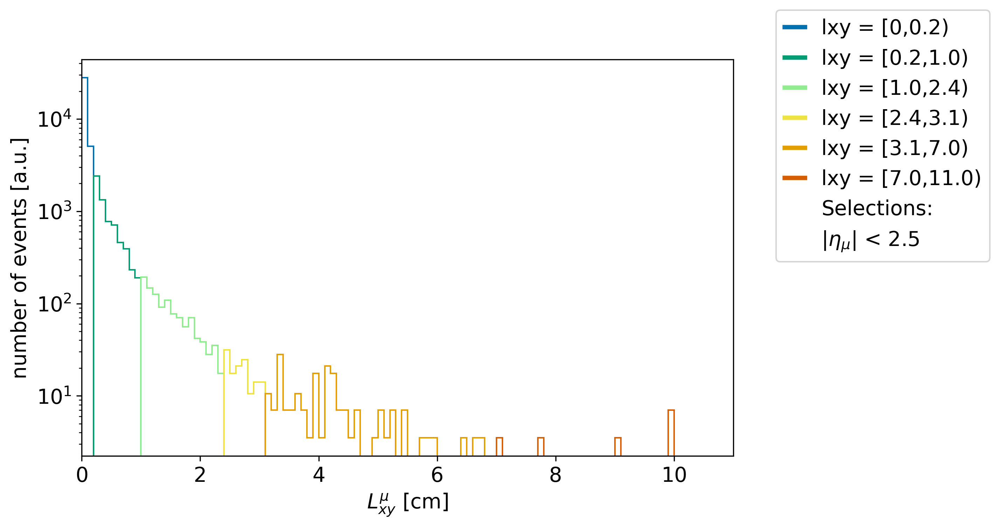

ValueError: math domain error

In [41]:

labels_ttj_lcuts = ["lxy = [0,0.2)","lxy = [0.2,1.0)","lxy = [1.0,2.4)","lxy = [2.4,3.1)","lxy = [3.1,7.0)",
                    "lxy = [7.0,11.0)",]
print("Plots of vertex_2d and invariant mass with different lxy cuts. In order: ttj_pairs, ttj_nonpairs,",
      " ttj_ss, ttj, ttj_single")
cross_ttj = [cross_ttj[0]]
N_ttj = [N_ttj[0]]
for i in range(len(data_ttj_lcuts[0])):
    cross_ttj.append(cross_ttj[0])
    N_ttj.append(N_ttj[0])
for i in range(len(data_ttj_lcuts[0])):
    data_ttj = [data_ttj_lcuts[0][i],data_ttj_lcuts[1][i],data_ttj_lcuts[2][i],data_ttj_lcuts[3][i],
                data_ttj_lcuts[4][i],data_ttj_lcuts[5][i]]
    mypl.hist1dcross(data("vertex_2d",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj_lcuts,
                     dirLabel["Lxy_mu"],nbins=110,customXlabels=[],customXlim=[0,11],log_scale=True,selLabel=selLabel)
    mypl.histloglog(data("inv_mass",["antimuon","muon"],"ttj"),[],cross_ttj,[],N_ttj,[],intlumi,labels_ttj_lcuts,
                    dirLabel["mmumu"],customXlabels=[],nbins=200,customXlim=[0.1,1000],selLabel=selLabel)
    mypl.histloglog(data("inv_mass",["antimuon","muon"],"ttj"),[],cross_ttj,[],N_ttj,[],intlumi,labels_ttj_lcuts,
                    dirLabel["mmumu"],customXlabels=[],nbins=200,customXlim=[0.1,10],selLabel=selLabel)
    data_ttj = [data_ttj_lcuts_pT5[0][i],data_ttj_lcuts_pT5[1][i],data_ttj_lcuts_pT5[2][i],data_ttj_lcuts_pT5[3][i],
                data_ttj_lcuts_pT5[4][i],data_ttj_lcuts_pT5[5][i]]
    mypl.hist1dcross(data("vertex_2d",["muon"],"ttj"),[],[],cross_ttj,[],[],N_ttj,[],[],intlumi,labels_ttj_lcuts,
                     dirLabel["Lxy_mu"],nbins=110,customXlabels=[],customXlim=[0,11],log_scale=True,selLabel=selLabel_pT5)
    mypl.histloglog(data("inv_mass",["antimuon","muon"],"ttj"),[],cross_ttj,[],N_ttj,[],intlumi,labels_ttj_lcuts,
                    dirLabel["mmumu"],customXlabels=[],nbins=200,customXlim=[0.1,10],selLabel=selLabel_pT5)

# Plotting signal + background

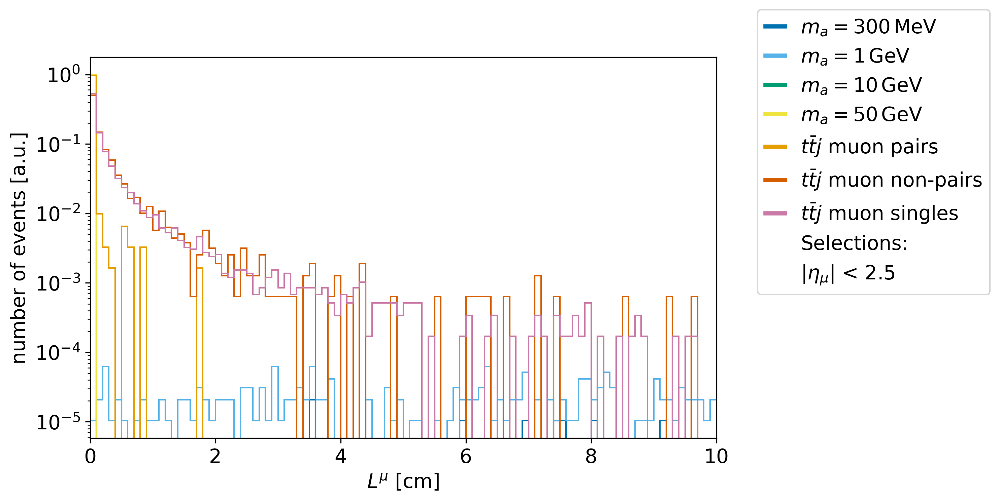

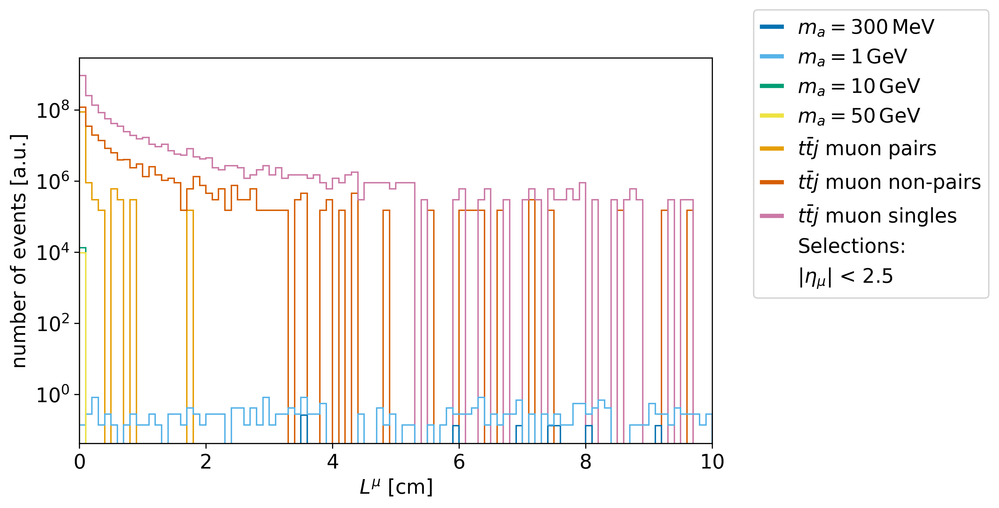

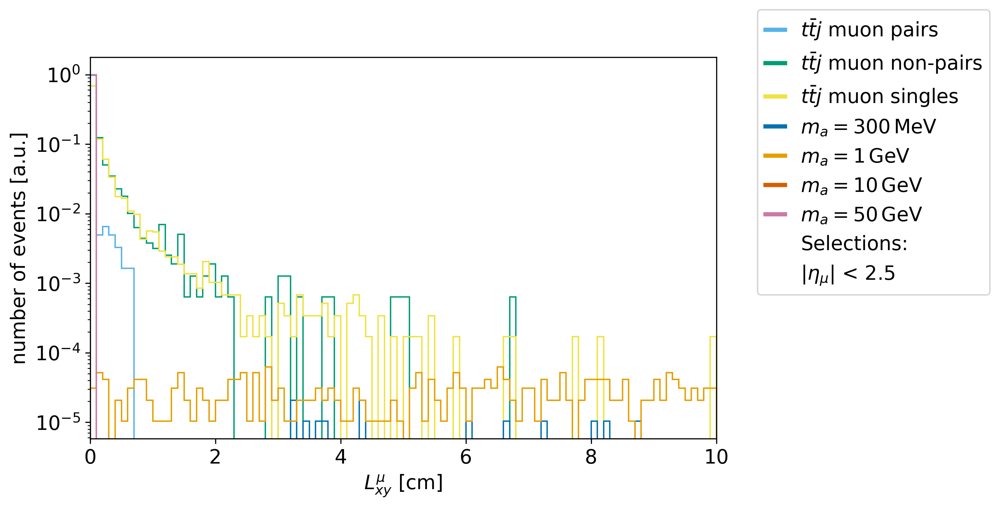

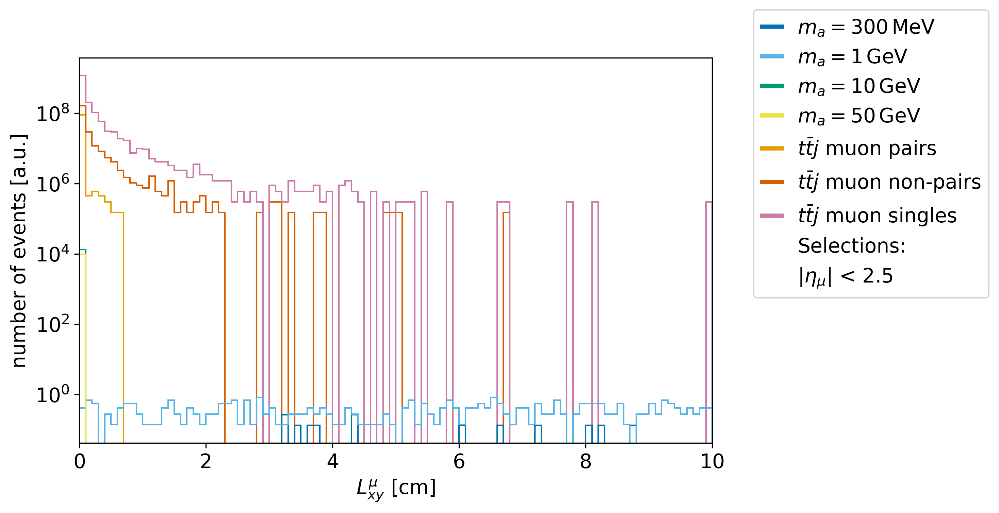

In [ ]:
data_ttj = [data_ttj_pair_e[0], data_ttj_nonpair_e[0], data_ttj_single_e[0]]
N_ttj = [100*100000,100*100000,100*100000]
cross_ttj = [cross_ttj[0],cross_ttj[0],cross_ttj[0]]

mypl.hist1dcomp2(data("vertex_3d",["muon"],"incl"),data("vertex_3d",["muon"],"ttj"),[],massLabels,
                 dirLabel["L_mu"],nbins=100,customXlabels=labels_ttj,customXlim=[0,10],log_scale=True,
                 selLabel=selLabel)
mypl.hist1dcross(data("vertex_3d",["muon"],"incl"),data("vertex_3d",["muon"],"ttj"),[],cross_incl,cross_ttj,[],
                 N_incl,N_ttj,[],intlumi,massLabels,dirLabel["L_mu"],nbins=100,customXlabels=labels_ttj,
                 customXlim=[0,10],log_scale=True,selLabel=selLabel)

mypl.hist1dcomp2(data("vertex_2d",["muon"],"ttj"),data("vertex_2d",["muon"],"incl"),[],labels_ttj,
                 dirLabel["Lxy_mu"],nbins=100,customXlabels=massLabels,customXlim=[0,10],log_scale=True,
                 selLabel=selLabel)
mypl.hist1dcross(data("vertex_2d",["muon"],"incl"),data("vertex_2d",["muon"],"ttj"),[],cross_incl,cross_ttj,[],
                 N_incl,N_ttj,[],intlumi,massLabels,dirLabel["Lxy_mu"],nbins=100,customXlabels=labels_ttj,
                 customXlim=[0,10],log_scale=True,selLabel=selLabel)

mypl.hist1dcomp2(data("ctau",["muon"],"incl"),data("ctau",["muon"],"ttj"),[],massLabels,
                 dirLabel["ctau"],nbins=100,customXlabels=labels_ttj,customXlim=[0,10],log_scale=True,
                 selLabel=selLabel)
mypl.hist1dcross(data("ctau",["muon"],"incl"),data("ctau",["muon"],"ttj"),[],cross_incl,cross_ttj,[],
                 N_incl,N_ttj,[],intlumi,massLabels,dirLabel["ctau"],nbins=100,customXlabels=labels_ttj,
                 customXlim=[0,10],log_scale=True,selLabel=selLabel)

mypl.hist1dcomp2(data("tau",["muon"],"incl"),data("tau",["muon"],"ttj"),[],massLabels,
                 dirLabel["tau"],nbins=100,customXlabels=labels_ttj,customXlim=[0,1e-5],log_scale=True,
                 selLabel=selLabel)
mypl.hist1dcross(data("tau",["muon"],"incl"),data("tau",["muon"],"ttj"),[],cross_incl,cross_ttj,[],
                 N_incl,N_ttj,[],intlumi,massLabels,dirLabel["tau"],nbins=100,customXlabels=labels_ttj,
                 customXlim=[0,1e-5],log_scale=True,selLabel=selLabel)

# Particle Ancestors
The following calculations, functions and plots are outdated, but still remaining in case we want to reuse it later

In [ ]:
def get_expected_events(datasets, cross_sections, intlumi, N_tot):
    if len(datasets) != len(cross_sections):
        print("Error: len(datasets) != len(cross_sections)")
    if len(datasets) != len(N_tot):
        print("Error: len(datasets) != len(N_tot)")
    else:
        for i in range(len(datasets)):
            n = len(datasets[i].events)*cross_sections[i]*intlumi/N_tot[i]
            sigma_n = math.sqrt(len(datasets[i].events))*cross_sections[i]*intlumi/N_tot[i]             
            print("Expected number of events: ", n, " +- ", sigma_n)
            
def get_figure_of_merit(signal, signal_cross, signal_N, background, background_cross, background_N, intlumi):
    nS = len(signal.events)*signal_cross*intlumi/signal_N
    nB = 0
    sigmaB2 = 0
    for i in range(len(background)):
        nB += len(background[i].events)*background_cross[i]*intlumi/background_N[i]
        sigmaBi = math.sqrt(len(background[i].events))*background_cross[i]*intlumi/background_N[i]
        sigmaB2 += sigmaBi*sigmaBi
    sigmaB = math.sqrt(sigmaB2)
    s = nS/math.sqrt(nS+nB+sigmaB)
    return s

# for time given in s
# returns decay length in cm
def get_decaylength_from_time(time):
    c = 299792458 # m/s
    return time*c*100
# for width given in keV
# returns decay length in cm
def get_decaylength_from_width(width):
    c = 299792458 # m/s
    hbar = 6.582119569e-16 #eV s
    hbar = hbar/1000 # keV s
    return (hbar*c/width)*100

# for width given in keV
# returns lifetime given in s
def get_tau_from_width(width):
    hbar = 6.582119569e-16 #eV s
    hbar = hbar/1000 # keV s
    return (hbar/width)

In [ ]:
# Particle widths
#Given in keV
t = 142e3 # 6

# Light unflavoured mesons
eta = 1.31 # 221
etap = 0.188e3 # 331
rho = 147.4e3 # 113  neutral only, e+e-
omega = 8.68e3 # 223
phi = 4.25e3 # 333
a10 = 600e3 # 20213 full width 250 to 600 MeV

# charmed mesons

dasteriskplus = 83.4 # 413
dasteriskzero = 2.1e3 # 423 less than with CL=90%
dsasteriskplus = 1.9e3 # 433 less than with CL=90%
jpsi = 92.6 # 443
psi2S = 294 # 100443
chic1 = 0.84e3 # 20443
chic0 = 10.8e3 # 10441
chic2 = 1.97e3 # 445

# bottom mesons
upsilon = 54.02 # 553
basterisksplus = 1.9e3 # 433 less than with CL=90%

# baryons
sigmabasteriskplus = 9.4e3 # 5224

# Particle mean life
#Given in s
tau = 2.903e-13 # 15

# charmed mesons
dplus = 1.033e-12 # 411
dzero = 4.103e-13 # 421
dsplus = 504e-15 # 431

# bottom mesons
bplus = 1.638e-12 # 521
bzero = 1.519e-12 # 511
bszero = 1.520e-12 # 531

# baryons
sigmaminus = 1.479e-10 # 3112
lambda_ = 2.632e-10 # 3122
ximinus = 1.639e-10 # 3312
xizero = 2.90e-10 # 3322
xiczero = 1.519e-13 # 4132
xicplus = 4.53e-13 # 4232
lambdacplus = 201.5e-15 # 4122
omegaczero = 2.68e-13 # 4332
lambdabzero = 1.471e-12 # 5122
xibminus = 1.572e-12 # 5132
xibzero = 1.480e-12 # 5232

decay_lengths = dict()

# All except the photons now (22) ...
decay_lengths.update({0:0})
decay_lengths.update({6:get_decaylength_from_width(t)})
decay_lengths.update({15:get_decaylength_from_time(tau)})
decay_lengths.update({113:get_decaylength_from_width(rho)})
decay_lengths.update({221:get_decaylength_from_width(eta)})
decay_lengths.update({223:get_decaylength_from_width(omega)})
decay_lengths.update({331:get_decaylength_from_width(etap)})
decay_lengths.update({333:get_decaylength_from_width(phi)})
decay_lengths.update({411:get_decaylength_from_time(dplus)})
decay_lengths.update({421:get_decaylength_from_time(dzero)})
decay_lengths.update({431:get_decaylength_from_time(dsplus)})
decay_lengths.update({433:get_decaylength_from_width(dsasteriskplus)})
decay_lengths.update({443:get_decaylength_from_width(jpsi)})
decay_lengths.update({445:get_decaylength_from_width(chic2)})
decay_lengths.update({511:get_decaylength_from_time(bzero)})
decay_lengths.update({521:get_decaylength_from_time(bplus)})
decay_lengths.update({531:get_decaylength_from_time(bszero)})
decay_lengths.update({553:get_decaylength_from_width(upsilon)})
decay_lengths.update({3112:get_decaylength_from_time(sigmaminus)})
decay_lengths.update({3122:get_decaylength_from_time(lambda_)})
decay_lengths.update({3312:get_decaylength_from_time(ximinus)})
decay_lengths.update({3322:get_decaylength_from_time(xizero)})
decay_lengths.update({4122:get_decaylength_from_time(lambdacplus)})
decay_lengths.update({4132:get_decaylength_from_time(xiczero)})
decay_lengths.update({4232:get_decaylength_from_time(xicplus)})
decay_lengths.update({4332:get_decaylength_from_time(omegaczero)})
decay_lengths.update({5122:get_decaylength_from_time(lambdabzero)})
decay_lengths.update({5132:get_decaylength_from_time(xibminus)})
decay_lengths.update({5232:get_decaylength_from_time(xibzero)})
decay_lengths.update({10441:get_decaylength_from_width(chic0)})
decay_lengths.update({20213:get_decaylength_from_width(a10)})
decay_lengths.update({20443:get_decaylength_from_width(chic1)})
decay_lengths.update({100443:get_decaylength_from_width(psi2S)})
print(decay_lengths)
print(len(decay_lengths))

taus = dict()

# All except the photons now (22) ...
taus.update({0:0})
taus.update({6:get_tau_from_width(t)})
taus.update({15:tau})
taus.update({113:get_tau_from_width(rho)})
taus.update({221:get_tau_from_width(eta)})
taus.update({223:get_tau_from_width(omega)})
taus.update({331:get_tau_from_width(etap)})
taus.update({333:get_tau_from_width(phi)})
taus.update({411:dplus})
taus.update({421:dzero})
taus.update({431:dsplus})
taus.update({433:get_tau_from_width(dsasteriskplus)})
taus.update({443:get_tau_from_width(jpsi)})
taus.update({445:get_tau_from_width(chic2)})
taus.update({511:bzero})
taus.update({521:bplus})
taus.update({531:bszero})
taus.update({553:get_tau_from_width(upsilon)})
taus.update({3112:sigmaminus})
taus.update({3122:lambda_})
taus.update({3312:ximinus})
taus.update({3322:xizero})
taus.update({4122:lambdacplus})
taus.update({4132:xiczero})
taus.update({4232:xicplus})
taus.update({4332:omegaczero})
taus.update({5122:lambdabzero})
taus.update({5132:xibminus})
taus.update({5232:xibzero})
taus.update({10441:get_tau_from_width(chic0)})
taus.update({20213:get_tau_from_width(a10)})
taus.update({20443:get_tau_from_width(chic1)})
taus.update({100443:get_tau_from_width(psi2S)})

print(taus)
print(len(taus))